# 1. Import

## 1.1 Import Libraries

In [677]:
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
import math
import warnings
plt.style.use('ggplot')

# Suppress all warnings
warnings.filterwarnings("ignore")

# for better resolution plots
%config InlineBackend.figure_format = 'retina'

# Seeting seaborn style
sns.set()

# Display all the df
pd.options.display.max_columns = None


## 1.2 Import Data

In [ ]:
# Read the CSV file
df = pd.read_csv("DM2425_ABCDEats_DATASET.csv")

In [679]:
#Create a backup of the df
df_backup=df

## Variables:
- customer_id: Unique identifier for each customer.
- customer_region: Geographic region where the customer is located.
- customer_age: Age of the customer.
- vendor_count: Number of unique vendors the customer has ordered from.
- product_count: Total number of products the customer has ordered.
- is_chain: Indicates whether the customer’s order was from a chain restaurant.
- first_order: Number of days from the start of the dataset when the customer first placed an order.
- last_order: Number of days from the start of the dataset when the customer most recently placed an order.
- last_promo: The category of the promotion or discount most recently used by the customer.
- payment_method: Method most recently used by the customer to pay for their orders.
- CUI_American,CUI_Asian,CUI_Chinese,CUI_Italian, etc.: The amount in monetary units spent by the customer from the indicated type of cuisine.
- DOW_0 to DOW_6: Number of orders placed on each day of the week (0 = Sunday, 6 = Saturday).
- HR_0 to HR_23: Number of orders placed during each hour of the day (0 = midnight, 23 = 11 PM).


# 2. Explore the Data

In [680]:
df.shape

(31888, 56)

In [681]:
# Display the first few rows of the dataframe
df.head()

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [682]:
#Check columns
df.columns.values

array(['customer_id', 'customer_region', 'customer_age', 'vendor_count',
       'product_count', 'is_chain', 'first_order', 'last_order',
       'last_promo', 'payment_method', 'CUI_American', 'CUI_Asian',
       'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese',
       'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian', 'CUI_Italian',
       'CUI_Japanese', 'CUI_Noodle Dishes', 'CUI_OTHER',
       'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1', 'DOW_2',
       'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2', 'HR_3',
       'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11',
       'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23'], dtype=object)

## Minor changes to the Data
1) Change the DOW columns to the days of the week names

2) Create new variables
  - Time Periods
  - Age Group



In [683]:
#1)
df= df.rename(columns={'DOW_0':'Sunday', 'DOW_1':'Monday', 'DOW_2':'Tuesday', 'DOW_3':'Wednesday', 'DOW_4':'Thursday', 'DOW_5':'Friday','DOW_6':'Saturday'})

In [684]:
#2
df['early_morning(0h-5h)'] = df.filter(regex=r'^HR_[0-5]$').sum(axis=1).astype(int)

df['morning(6h-11h)'] = df.filter(regex=r'^HR_([6-9]|1[0-1])$').sum(axis=1).astype(int)

df['afternoon(12h-17h)']= df.filter(regex=r'^HR_1[2-7]$').sum(axis=1).astype(int)

df['night(18h-23h)'] = df.filter(regex=r'^HR_(1[8-9]|2[0-3])$').sum(axis=1).astype(int)


In [685]:
#2
age_labels = ['Teenagers (15-19)', 'Young Adults (20-29)', 'Adults (30-49)', 'Middle-aged (50-64)', 'Seniors (65-80)']
df['age_group'] = pd.cut(df['customer_age'], bins=[15, 20, 30, 50, 65, 80], labels=age_labels, right=False)

## Data Analysis

### Data types:
- customer_age -> float? (change to int)
- first_order -> float? (change to int or date time (days) ?)
- last_order (change to date time (days) ?)
- HR_0 -> float? (change to int)

In [686]:
#Create a df only with the original variables (Drop the new columns created)
df_original = df.drop(columns=['early_morning(0h-5h)','morning(6h-11h)','afternoon(12h-17h)','night(18h-23h)','age_group'])

In [687]:
# Check data types
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31888 entries, 0 to 31887
Data columns (total 56 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               31888 non-null  object 
 1   customer_region           31888 non-null  object 
 2   customer_age              31161 non-null  float64
 3   vendor_count              31888 non-null  int64  
 4   product_count             31888 non-null  int64  
 5   is_chain                  31888 non-null  int64  
 6   first_order               31782 non-null  float64
 7   last_order                31888 non-null  int64  
 8   last_promo                31888 non-null  object 
 9   payment_method            31888 non-null  object 
 10  CUI_American              31888 non-null  float64
 11  CUI_Asian                 31888 non-null  float64
 12  CUI_Beverages             31888 non-null  float64
 13  CUI_Cafe                  31888 non-null  float64
 14  CUI_Ch

### 
Fix data types:

In [688]:
df['customer_age'] = df['customer_age'].astype('Int64')
df['first_order'] = df['first_order'].astype('Int64')
df['HR_0'] = df['HR_0'].astype('Int64')

In [689]:
#Check only the original df = Categorical Variables
df_original.describe(include="O").T

,count,unique,top,freq
customer_id,31888,31875,742ca068fc,2
customer_region,31888,9,8670,9761
last_promo,31888,4,-,16748
payment_method,31888,3,CARD,20161


In [690]:
#Check only the original df = Numerical Variables
df_original.describe(include=np.number).T

,count,mean,std,min,25%,50%,75%,max
customer_age,31161.0,27.506499,7.160898,15.0,23.0,26.0,31.00,80.00
vendor_count,31888.0,3.102609,2.771587,0.0,1.0,2.0,4.00,41.00
product_count,31888.0,5.668245,6.957287,0.0,2.0,3.0,7.00,269.00
is_chain,31888.0,2.818866,3.977529,0.0,1.0,2.0,3.00,83.00
first_order,31782.0,28.478604,24.109086,0.0,7.0,22.0,45.00,90.00
last_order,31888.0,63.675521,23.226123,0.0,49.0,70.0,83.00,90.00
CUI_American,31888.0,4.880438,11.654018,0.0,0.0,0.0,5.66,280.21
CUI_Asian,31888.0,9.960451,23.564351,0.0,0.0,0.0,11.83,896.71
CUI_Beverages,31888.0,2.300633,8.479734,0.0,0.0,0.0,0.00,229.22
CUI_Cafe,31888.0,0.801163,6.427132,0.0,0.0,0.0,0.00,326.10


In [691]:
#Drop the customer_id column? (irrelevant? 31875 unique values, but it will be useful to identify the customers in a later analysis)
df_without_id = df.drop(['customer_id'], axis=1)    

In [692]:
#Identify customer_id duplicated (since it should be a unique value)
duplicate_values = df['customer_id'].value_counts()[df['customer_id'].value_counts() > 1]

duplicate_rows = df[df['customer_id'].isin(duplicate_values.index)]

print(duplicate_rows)
print("\n")
print(f'Total: {len(duplicate_rows)}') #drop it?

      customer_id customer_region  customer_age  vendor_count  product_count  \
3355   b55012ee1c            8550            23             4             11   
3379   b55012ee1c            8550            23             4             11   
7867   24251eb7da            8550            28             4              8   
7887   24251eb7da            8550            28             4              8   
16227  671bf0c738            8550            25             4              7   
16230  671bf0c738            8550            25             4              7   
20855  742ca068fc            8550            20             1              2   
20907  742ca068fc            8550            20             1              2   
24328  df91183978            8550            23             2              3   
24329  df91183978            8550            23             2              3   
24822  6bbf5f74cd            8550            22            10             20   
24827  6bbf5f74cd            8550       

### Check for missing values:

In [693]:
df.isna().any()

customer_id             False
customer_region         False
customer_age             True
vendor_count            False
product_count           False
                        ...  
early_morning(0h-5h)    False
morning(6h-11h)         False
afternoon(12h-17h)      False
night(18h-23h)          False
age_group                True
Length: 61, dtype: bool

In [694]:
df.isna().sum()

customer_id               0
customer_region           0
customer_age            727
vendor_count              0
product_count             0
                       ... 
early_morning(0h-5h)      0
morning(6h-11h)           0
afternoon(12h-17h)        0
night(18h-23h)            0
age_group               730
Length: 61, dtype: int64

In [695]:
#Check the % of the missing values:
missing_percentage = (df.isnull().mean() * 100).sort_values(ascending=False)

print("Percentage of Missing Values:")
print(missing_percentage)

Percentage of Missing Values:
HR_0            3.653412
age_group       2.289262
customer_age    2.279854
first_order     0.332413
HR_8            0.000000
                  ...   
Monday          0.000000
Tuesday         0.000000
Wednesday       0.000000
Thursday        0.000000
Friday          0.000000
Length: 61, dtype: float64


###
Missing Values : HR_0

In [696]:
#Check when HR_0 = NaN, which is the variable with most missing values
nan_HR_0 = df[df['HR_0'].isna()]
pd.set_option('display.max_columns', None)
nan_HR_0

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,early_morning(0h-5h),morning(6h-11h),afternoon(12h-17h),night(18h-23h),age_group
34,ae38da6386,8670,21,2,3,1,0,7,DELIVERY,DIGI,0.00,23.70,0.0,0.0,0.0,12.08,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,0,0,0,0,0,2,<NA>,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Young Adults (20-29)
87,a21a839c77,4140,19,1,4,4,0,21,-,CARD,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,22.09,0.0,0,0,0,0,0,0,4,<NA>,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,2,Teenagers (15-19)
121,9237d23413,8670,22,3,4,2,0,27,-,CARD,5.77,17.76,5.9,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,1,0,0,0,1,2,<NA>,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2,1,0,0,Young Adults (20-29)
132,8c6ffd7357,4660,25,3,4,1,0,28,-,CARD,27.54,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,6.10,0.0,0.0,0.0,0.00,0.0,0,0,0,0,0,0,3,<NA>,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,Young Adults (20-29)
186,67c6c9f9c4,4660,24,1,3,0,0,36,FREEBIE,DIGI,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,6.14,0.0,0.0,0.0,0.00,0.0,1,0,1,0,0,0,1,<NA>,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,Young Adults (20-29)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31298,37b72b449d,2360,23,1,4,0,85,85,DELIVERY,DIGI,0.00,24.08,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,1,0,0,0,0,0,0,<NA>,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)
31549,ac382ddfd1,-,28,1,2,2,87,89,DELIVERY,CARD,0.00,17.87,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,0,1,0,1,0,0,<NA>,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,Young Adults (20-29)
31615,96f1fc25e3,8670,25,2,2,1,88,88,DELIVERY,CASH,0.00,17.98,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,0,0,2,0,0,0,<NA>,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Young Adults (20-29)
31781,d7c7face7e,2440,26,1,1,1,90,90,DELIVERY,CASH,2.61,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,0,0,0,0,1,0,<NA>,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)


In [697]:
#Define the columns of the DOW and the HR columns
dow_columns = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
hr_columns = [col for col in df.columns if col.startswith('HR_')]

In [698]:
#To replace the NaN's of HR_0, let's compare the sum of orders of the DOW with the sum of orders of the HR:
#If it's the same, then HR_0 should be 0, if not, it's the difference between the 2 values, since the sum should be equal

row_sum_dow = df[dow_columns].sum(axis=1)
row_sum_hr = df[hr_columns].sum(axis=1)

row_difference = row_sum_dow - row_sum_hr

df.loc[df['HR_0'].isna(), 'HR_0'] = row_difference

df['HR_0'].head()


0    0
1    0
2    0
3    0
4    0
Name: HR_0, dtype: Int64

In [699]:
df['HR_0'].isna().sum()

0

###
Missing Values : first_order

In [700]:
#Check when first_order = NaN
nan_first_order = df[df['first_order'].isna()]
nan_first_order

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,early_morning(0h-5h),morning(6h-11h),afternoon(12h-17h),night(18h-23h),age_group
31782,0366fbb035,8670,24,1,1,0,<NA>,0,-,DIGI,0.00,11.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Young Adults (20-29)
31783,039d7c8a20,4660,23,1,1,0,<NA>,0,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,14.49,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,Young Adults (20-29)
31784,04c9d25c93,8670,27,1,1,1,<NA>,0,DISCOUNT,CASH,18.16,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Young Adults (20-29)
31785,09118ae9e7,8670,36,1,1,0,<NA>,0,-,CARD,0.00,6.02,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Adults (30-49)
31786,0d1f298bbd,4660,22,1,1,1,<NA>,0,DISCOUNT,CASH,5.22,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,Young Adults (20-29)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31883,f4e366c281,8670,30,1,1,1,<NA>,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Adults (30-49)
31884,f6b6709018,8670,<NA>,1,1,0,<NA>,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,NaN
31885,f74ad8ce3f,8670,24,1,1,1,<NA>,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,Young Adults (20-29)
31886,f7b19c0241,8670,34,1,1,0,<NA>,0,DISCOUNT,DIGI,0.00,12.03,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Adults (30-49)


###
It seem that when the first_order is a missing value, the last_order = 0.

- This is because who never order, since the creation of the data set, will not have a last order, but if the first order is replaced with 0, then it will mean that there was a order 
in the last 24h, which may not be true
- Another possibility is that there was, in fact, a last order in the last 24h (last_order=0) and the first_order simply does not have info

In [701]:
df[df['first_order'].isna() & (df_original['last_order'] == 0)]

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,early_morning(0h-5h),morning(6h-11h),afternoon(12h-17h),night(18h-23h),age_group
31782,0366fbb035,8670,24,1,1,0,<NA>,0,-,DIGI,0.00,11.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Young Adults (20-29)
31783,039d7c8a20,4660,23,1,1,0,<NA>,0,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,14.49,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,Young Adults (20-29)
31784,04c9d25c93,8670,27,1,1,1,<NA>,0,DISCOUNT,CASH,18.16,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Young Adults (20-29)
31785,09118ae9e7,8670,36,1,1,0,<NA>,0,-,CARD,0.00,6.02,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Adults (30-49)
31786,0d1f298bbd,4660,22,1,1,1,<NA>,0,DISCOUNT,CASH,5.22,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,Young Adults (20-29)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31883,f4e366c281,8670,30,1,1,1,<NA>,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Adults (30-49)
31884,f6b6709018,8670,<NA>,1,1,0,<NA>,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,NaN
31885,f74ad8ce3f,8670,24,1,1,1,<NA>,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,Young Adults (20-29)
31886,f7b19c0241,8670,34,1,1,0,<NA>,0,DISCOUNT,DIGI,0.00,12.03,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Adults (30-49)


###
Missing Values : customer_age

In [702]:
#Check when customer_age = NaN
nan_customer_age = df[df['customer_age'].isna()]
nan_customer_age

#Maybe replace the missing values with the mean or median

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,early_morning(0h-5h),morning(6h-11h),afternoon(12h-17h),night(18h-23h),age_group
3,180c632ed8,4660,<NA>,2,3,1,0,2,DELIVERY,DIGI,0.00,13.70,0.00,0.0,0.0,0.0,0.00,0.0,17.86,0.00,0.0,0.0,0.00,0.00,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,NaN
27,8e8652bdc8,4660,<NA>,2,3,2,0,6,DISCOUNT,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,34.88,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,2,0,NaN
37,6137fa5620,8670,<NA>,2,2,2,0,8,DISCOUNT,CARD,6.13,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,13.15,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,NaN
69,2a90e9da84,4660,<NA>,2,2,1,0,17,-,CARD,15.99,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,1.54,0.0,0.0,0.00,0.00,0.0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,1,NaN
73,a67d3108cb,8670,<NA>,2,2,1,0,17,-,CARD,0.00,25.85,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31488,46aa9dfeb0,8670,<NA>,1,2,0,87,87,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,25.05,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,NaN
31572,29207a92c8,2360,<NA>,1,1,1,88,88,-,CASH,0.00,0.00,3.88,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,NaN
31762,d7bf721199,2360,<NA>,1,1,1,89,89,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,3.74,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,NaN
31877,ee49f4eb0a,2440,<NA>,1,1,1,<NA>,0,DELIVERY,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,3.16,0.00,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,NaN


### Check for Duplicates:

In [703]:
df.duplicated().sum()

13

In [704]:
df.loc[df_original.duplicated(keep=False)]

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,early_morning(0h-5h),morning(6h-11h),afternoon(12h-17h),night(18h-23h),age_group
3355,b55012ee1c,8550,23,4,11,1,2,89,FREEBIE,CARD,0.00,93.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,3,2,3,1,1,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,Young Adults (20-29)
3379,b55012ee1c,8550,23,4,11,1,2,89,FREEBIE,CARD,0.00,93.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,3,2,3,1,1,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0,Young Adults (20-29)
7867,24251eb7da,8550,28,4,8,3,7,85,-,CARD,30.44,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32.27,0.0,1,0,3,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,3,0,2,0,Young Adults (20-29)
7887,24251eb7da,8550,28,4,8,3,7,85,-,CARD,30.44,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32.27,0.0,1,0,3,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,3,0,2,0,Young Adults (20-29)
16227,671bf0c738,8550,25,4,7,3,23,66,FREEBIE,CARD,56.18,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.53,0.0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,2,1,Young Adults (20-29)
16230,671bf0c738,8550,25,4,7,3,23,66,FREEBIE,CARD,56.18,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.53,0.0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,2,1,Young Adults (20-29)
20855,742ca068fc,8550,20,1,2,0,35,35,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,31.57,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Young Adults (20-29)
20907,742ca068fc,8550,20,1,2,0,35,35,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,31.57,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Young Adults (20-29)
24328,df91183978,8550,23,2,3,1,47,52,DELIVERY,CARD,0.00,18.78,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.34,0.0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,Young Adults (20-29)
24329,df91183978,8550,23,2,3,1,47,52,DELIVERY,CARD,0.00,18.78,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.34,0.0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,Young Adults (20-29)


In [705]:
#% of duplicates:
df.duplicated().mean()*100

0.040767686904164574

In [706]:
#Drop the duplicates, since it's a very small amount????
df.drop_duplicates(inplace=True)

### Check for unique values:

#### Region

In [707]:
df['customer_region'].value_counts()

customer_region
8670    9761
4660    9550
2360    8829
2440    1483
4140     857
8370     495
2490     445
-        442
8550      13
Name: count, dtype: int64

In [708]:
(len(df[df['customer_region'] == '-']) / len(df))*100

1.3866666666666667

- '-' -> Strange = 1,386%; Maybe use mode or drop?
- There are 3 cities, so should we aggregate the cities by the first number of the region? (2,4,8)
- Another possibilitie is to aggregate the cities based on the frequency of customers. (1 (>5000) - 8670, 4660, 2360; 2 (<5000 & >1000) - 2440, 4140; 3 (<1000) - 8370, 2490, -, 8550 )
- (issue to think about and address in the future, 1 option keeps the distribution balanced and the other does not)

#### Age

In [709]:
df['customer_age'].unique()

<IntegerArray>
[  18,   17,   38, <NA>,   20,   40,   24,   27,   33,   26,   21,   51,   35,
   22,   31,   15,   47,   19,   28,   32,   25,   37,   42,   48,   16,   34,
   29,   23,   30,   39,   46,   41,   49,   53,   36,   43,   44,   45,   57,
   58,   68,   56,   61,   60,   54,   59,   50,   55,   52,   65,   75,   66,
   79,   80,   63,   77,   62,   69,   72,   64,   76,   74,   67,   70,   78,
   71,   73]
Length: 67, dtype: Int64

In [710]:
df[(df['customer_age'] == 15) | (df['customer_age'] == 16)| (df['customer_age'] == 17)]
#It could be a problem since it's a minor

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,early_morning(0h-5h),morning(6h-11h),afternoon(12h-17h),night(18h-23h),age_group
1,5d272b9dcb,8670,17,2,2,2,0,1,DISCOUNT,DIGI,12.82,6.39,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,Teenagers (15-19)
20,e79f867434,8670,15,2,3,1,0,5,DELIVERY,DIGI,6.06,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,23.92,0.00,0.0,0.00,0.00,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,Teenagers (15-19)
55,63cb294ad9,8670,16,5,8,1,0,13,-,CARD,0.00,56.16,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,24.56,0.00,2,2,0,0,0,1,1,0,0,1,1,0,0,0,0,1,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,2,4,0,0,Teenagers (15-19)
65,6f36cc3a8c,2360,17,2,4,2,0,16,-,CASH,0.00,0.00,0.00,0.0,6.88,0.0,0.0,0.0,0.00,0.0,0.00,12.40,0.0,0.00,0.00,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,Teenagers (15-19)
154,a4d5c3fd0f,2360,17,4,6,4,0,31,-,DIGI,0.00,0.00,9.06,0.0,0.00,0.0,0.0,0.0,0.00,0.0,19.15,4.09,0.0,0.00,0.00,0,0,2,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,2,0,1,0,0,0,0,1,3,Teenagers (15-19)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31454,fcdb9ad549,4660,17,1,2,0,86,86,DELIVERY,CARD,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,18.87,0.00,0.0,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,Teenagers (15-19)
31511,adf17e4ce1,4140,17,1,1,1,87,87,-,CARD,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,7.50,0.00,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,Teenagers (15-19)
31654,13bf3a1137,4140,17,1,3,0,88,89,-,CASH,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,17.13,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,2,0,Teenagers (15-19)
31662,0349679dc2,-,17,1,2,0,89,89,FREEBIE,DIGI,0.00,23.86,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,Teenagers (15-19)


#### Promotion

In [711]:
df['last_promo'].value_counts()

last_promo
-           16744
DELIVERY     6282
DISCOUNT     4496
FREEBIE      4353
Name: count, dtype: int64

- '-' -> Changing to 'NO PROMO', to be more perceptible

In [712]:
df['last_promo'] = df['last_promo'].replace('-', 'N0 PROMO')

#### Payment Method

In [713]:
df['payment_method'].value_counts()

payment_method
CARD    20153
DIGI     6098
CASH     5624
Name: count, dtype: int64

#### First Order

In [714]:
df['first_order'].unique()

<IntegerArray>
[   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,   10,   11,   12,
   13,   14,   15,   16,   17,   18,   19,   20,   21,   22,   23,   24,   25,
   26,   27,   28,   29,   30,   31,   32,   33,   34,   35,   36,   37,   38,
   39,   40,   41,   42,   43,   44,   45,   46,   47,   48,   49,   50,   51,
   52,   53,   54,   55,   56,   57,   58,   59,   60,   61,   62,   63,   64,
   65,   66,   67,   68,   69,   70,   71,   72,   73,   74,   75,   76,   77,
   78,   79,   80,   81,   82,   83,   84,   85,   86,   87,   88,   89,   90,
 <NA>]
Length: 92, dtype: Int64

In [715]:
df['first_order'].max()
#Makes sense because the dataset is from a three-month period

90

#### Last Order

In [716]:
df['last_order'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13, 14, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87,
       88, 89, 90,  9, 15,  0], dtype=int64)

In [717]:
df['first_order'].max()

90

#### Is Chain

In [718]:
df['is_chain'].unique()

array([ 1,  2,  0,  3,  5,  4,  7, 12,  6, 23,  8, 11, 20, 14,  9, 10, 16,
       15, 13, 25, 17, 27, 30, 32, 24, 18, 26, 28, 22, 40, 31, 39, 21, 37,
       19, 33, 65, 38, 29, 45, 47, 73, 81, 56, 35, 46, 67, 44, 61, 34, 36,
       49, 83, 75, 43, 42, 48, 63, 54, 80], dtype=int64)

#### DOW 

In [719]:
for column in dow_columns:
    unique_values = df[column].unique()  # Get unique values
    print(f"Column: {column}")
    print(f"Unique Values: {unique_values}")
    print("-" * 70)

Column: Monday
Unique Values: [ 0  1  2  3  6  4  9  5 10  8  7 11 13 15 17 16 12]
----------------------------------------------------------------------
Column: Tuesday
Unique Values: [ 0  1  2  3  4  9  5  7  6  8 15 14 10 11 12 13]
----------------------------------------------------------------------
Column: Wednesday
Unique Values: [ 0  1  2  3  4  8  5  6  7  9 10 14 11 17 13 12 16]
----------------------------------------------------------------------
Column: Thursday
Unique Values: [ 0  1  2  3  6 10  4  7  5  8  9 11 14 12 13 15 16]
----------------------------------------------------------------------
Column: Friday
Unique Values: [ 0  1  2  3  5  4 10  7  9  6  8 13 11 15 12 20 14]
----------------------------------------------------------------------
Column: Saturday
Unique Values: [ 1  2  3  4  7  9  6  5  8 10 11 17 13 12 14 20  0]
----------------------------------------------------------------------
Column: Sunday
Unique Values: [ 1  0  2  3  5  4  9  6  8 10  7 11 15 1

#### Hours

In [720]:
for column in hr_columns:
    unique_values = df[column].unique()  # Get unique values
    print(f"Column: {column}")
    print(f"Unique Values: {unique_values}")
    print("-" * 70)

Column: HR_0
Unique Values: <IntegerArray>
[0, 1, 2, 3, 5, 4, 12, 9, 8, 7, 6, 11, 15]
Length: 13, dtype: Int64
----------------------------------------------------------------------
Column: HR_1
Unique Values: [ 0  1  2  4  3  5  9  6  8 14  7]
----------------------------------------------------------------------
Column: HR_2
Unique Values: [ 0  1  2  5  7  3 12  6  8 10  9  4]
----------------------------------------------------------------------
Column: HR_3
Unique Values: [ 0  1  2  5  7  3  4  6  8 10 11  9]
----------------------------------------------------------------------
Column: HR_4
Unique Values: [ 0  1  2 13  5 10  3  7  4 14  8  6  9]
----------------------------------------------------------------------
Column: HR_5
Unique Values: [0 1 2 4 3 7 5]
----------------------------------------------------------------------
Column: HR_6
Unique Values: [0 1 2 4 3 7 8 5 6]
----------------------------------------------------------------------
Column: HR_7
Unique Values: [ 0  1  

### Cuisine Types

In [721]:
for col in df.columns:
    if col.startswith('CUI_'):
        unique_values = df[col].unique()  
        print(f"Column: {col}")
        print(f"Unique Values: {unique_values}")
        print("-" * 70)

Column: CUI_American
Unique Values: [ 0.   12.82  9.2  ... 14.45 23.12  8.65]
----------------------------------------------------------------------
Column: CUI_Asian
Unique Values: [ 0.    6.39 13.7  ... 22.71 17.23  2.21]
----------------------------------------------------------------------
Column: CUI_Beverages
Unique Values: [ 0.    1.53 24.4  ... 62.8  23.44 32.57]
----------------------------------------------------------------------
Column: CUI_Cafe
Unique Values: [ 0.    5.07  2.6  ... 10.9   2.73 13.06]
----------------------------------------------------------------------
Column: CUI_Chicken Dishes
Unique Values: [ 0.    6.21  5.59 ...  4.92 11.53 10.76]
----------------------------------------------------------------------
Column: CUI_Chinese
Unique Values: [ 0.   11.31 31.05 ...  0.68 38.27 24.74]
----------------------------------------------------------------------
Column: CUI_Desserts
Unique Values: [ 0.    9.72  5.82 ...  4.08 25.69 17.79]
-----------------------------

# 3. Feature Understanding

### 
Define groups of columns and create a new feature = Sum_of_Orders

In [722]:
#Define groups of columns of the same category
dow_columns = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
hr_columns = [col for col in df.columns if col.startswith('HR_')]
CUI_columns = [col for col in df.columns if col.startswith('CUI_')]
time_columns = ['early_morning(0h-5h)','morning(6h-11h)','afternoon(12h-17h)', 'night(18h-23h)']

#Define the sum of the columns
DOW_counts = df[dow_columns].sum()
HR_counts = df[hr_columns].sum()
CUI_counts = df[CUI_columns].sum()
time_counts = df[time_columns].sum()

#Define a new Feature that contains the sum of orders by customer (it has the same info as DOW_counts and HR_counts)
df['Sum_of_Orders'] = df[['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']].sum(axis=1)


### 
Aggregate the regions of customers by city ?

####
Option 1 - Based on the first digit

In [723]:
# Creating new variable customer_city_1 dividied into categories 
def categorize_city_1(customer_region):
    if pd.isna(customer_region):  # Check if the value is NaN
        return np.nan 
    elif customer_region== "-":
        return "Other"
    elif customer_region[0].isdigit():
        return customer_region[0]
    else:
        return "Other"


# Apply the function to create the new 'customer_city' column
df['customer_city_1'] = df['customer_region'].apply(categorize_city_1)

print(df['customer_city_1'].value_counts(dropna=False))

customer_city_1
2        10757
4        10407
8        10269
Other      442
Name: count, dtype: int64


####
Option 2 - Based on the count distribution

In [724]:
df['customer_region'].value_counts()

customer_region
8670    9761
4660    9550
2360    8829
2440    1483
4140     857
8370     495
2490     445
-        442
8550      13
Name: count, dtype: int64

In [725]:
# Creating new variable customer_city_2 dividied into categories 
def categorize_city_2(customer_region):
    if pd.isna(customer_region):  # Check if the value is NaN
        return np.nan
    elif customer_region== "-":
        return "Other" 
    elif customer_region in ["8670", "4660", "2360"]:
        return "City 1"
    elif customer_region in ["2440", "4140"]:
        return "City 2"
    else:
        return "City 3"


# Apply the function to create the new 'customer_city' column
df['customer_city_2'] = df['customer_region'].apply(categorize_city_2)

print(df['customer_city_2'].value_counts(dropna=False))

customer_city_2
City 1    28140
City 2     2340
City 3      953
Other       442
Name: count, dtype: int64


###
Check comparation between First Order and Last Order

In [726]:
result = df[df['last_order'] < df['first_order']]
print(result)
#All good, since it wouldn't make sense if there was a last order before a first order

Empty DataFrame
Columns: [customer_id, customer_region, customer_age, vendor_count, product_count, is_chain, first_order, last_order, last_promo, payment_method, CUI_American, CUI_Asian, CUI_Beverages, CUI_Cafe, CUI_Chicken Dishes, CUI_Chinese, CUI_Desserts, CUI_Healthy, CUI_Indian, CUI_Italian, CUI_Japanese, CUI_Noodle Dishes, CUI_OTHER, CUI_Street Food / Snacks, CUI_Thai, Sunday, Monday, Tuesday, Wednesday, Thursday, Friday, Saturday, HR_0, HR_1, HR_2, HR_3, HR_4, HR_5, HR_6, HR_7, HR_8, HR_9, HR_10, HR_11, HR_12, HR_13, HR_14, HR_15, HR_16, HR_17, HR_18, HR_19, HR_20, HR_21, HR_22, HR_23, early_morning(0h-5h), morning(6h-11h), afternoon(12h-17h), night(18h-23h), age_group, Sum_of_Orders, customer_city_1, customer_city_2]
Index: []


###
 Define Numerical and Categorical Features

In [727]:
numerical_features=['customer_age', 'vendor_count','product_count', 'is_chain', 'first_order', 'last_order']
categorical_features=['customer_region','last_promo','payment_method', 'customer_city_1','customer_city_2', 'age_group']

## Numerical Features

In [728]:
def analyze_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_lim = Q1 - 1.5 * IQR
    upper_lim = Q3 + 1.5 * IQR
    outliers = data[(data < lower_lim) | (data > upper_lim)]
    percentage = (len(outliers) / len(data)) * 100  
    return len(outliers), percentage, lower_lim, upper_lim

 Statistics for column: customer_age
  Mean: 27.51
  Median: 26.00
  Standard Deviation: 7.16
  Min: 15
  Max: 80
  Skewness: 1.56
  Kurtosis: 4.08
--------------------------------------------------


Count of outliers: 1083
Percentage of outliers: 3.40%
Lower Lim:11.0
Upper Lim:43.0
----------------------------------------


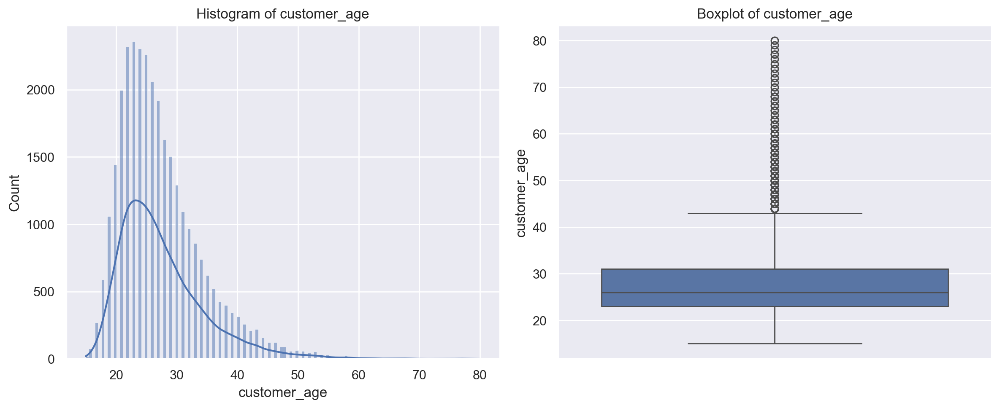

 Statistics for column: vendor_count
  Mean: 3.10
  Median: 2.00
  Standard Deviation: 2.77
  Min: 0
  Max: 41
  Skewness: 3.02
  Kurtosis: 15.60
--------------------------------------------------
Count of outliers: 1523
Percentage of outliers: 4.78%
Lower Lim:-3.5
Upper Lim:8.5
----------------------------------------


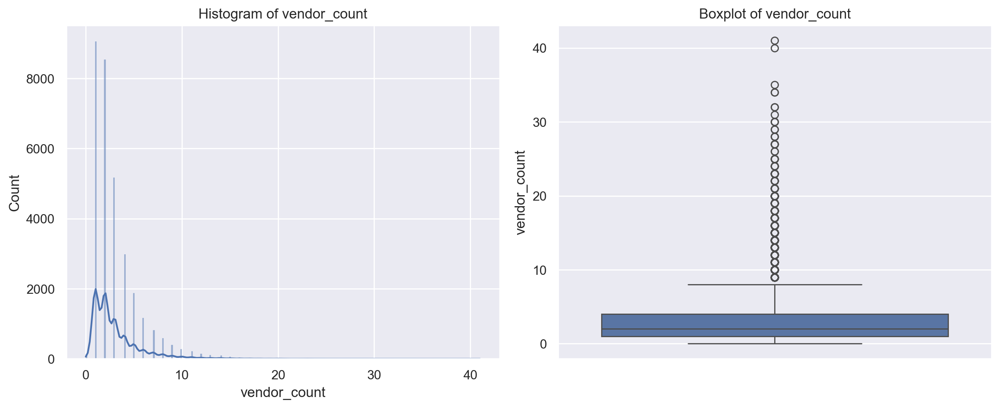

 Statistics for column: product_count
  Mean: 5.67
  Median: 3.00
  Standard Deviation: 6.96
  Min: 0
  Max: 269
  Skewness: 5.71
  Kurtosis: 92.86
--------------------------------------------------
Count of outliers: 2370
Percentage of outliers: 7.44%
Lower Lim:-5.5
Upper Lim:14.5
----------------------------------------


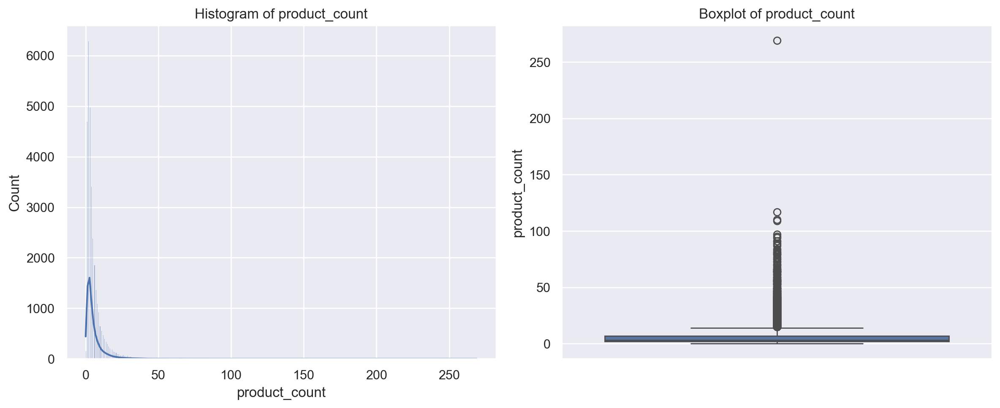

 Statistics for column: is_chain
  Mean: 2.82
  Median: 2.00
  Standard Deviation: 3.98
  Min: 0
  Max: 83
  Skewness: 4.99
  Kurtosis: 48.45
--------------------------------------------------
Count of outliers: 3154
Percentage of outliers: 9.89%
Lower Lim:-2.0
Upper Lim:6.0
----------------------------------------


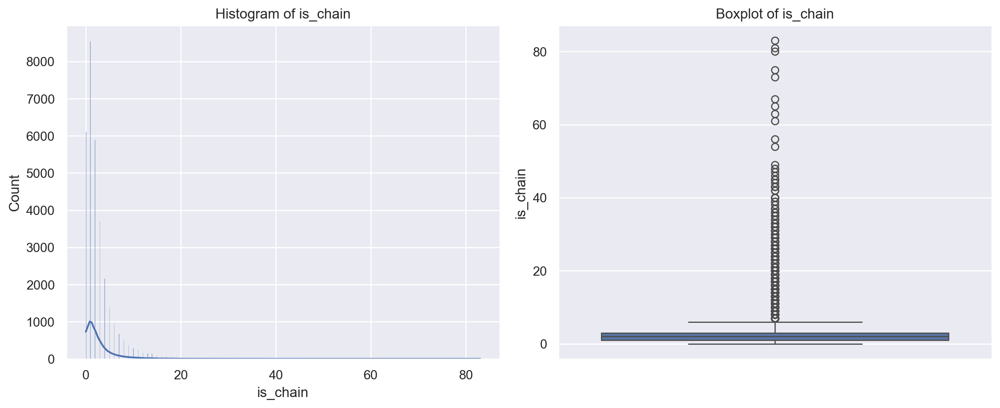

 Statistics for column: first_order
  Mean: 28.47
  Median: 22.00
  Standard Deviation: 24.10
  Min: 0
  Max: 90
  Skewness: 0.75
  Kurtosis: -0.50
--------------------------------------------------
Count of outliers: 0
Percentage of outliers: 0.00%
Lower Lim:-50.0
Upper Lim:102.0
----------------------------------------


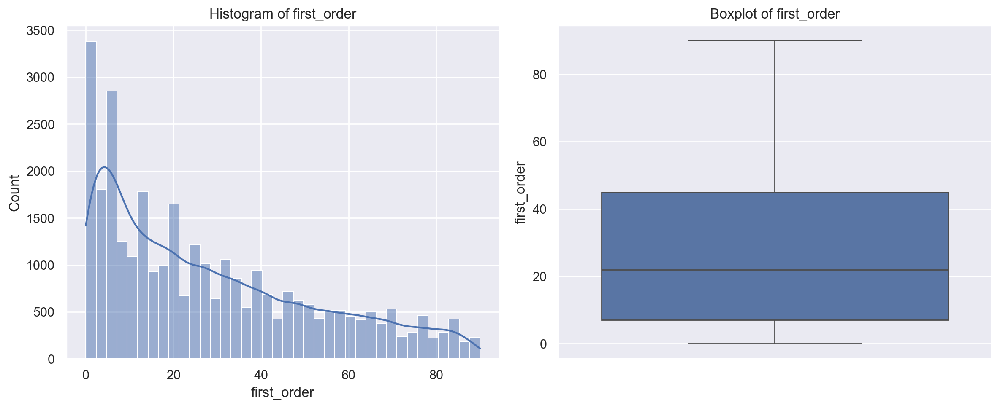

 Statistics for column: last_order
  Mean: 63.67
  Median: 70.00
  Standard Deviation: 23.23
  Min: 0
  Max: 90
  Skewness: -0.93
  Kurtosis: -0.13
--------------------------------------------------
Count of outliers: 0
Percentage of outliers: 0.00%
Lower Lim:-2.0
Upper Lim:134.0
----------------------------------------


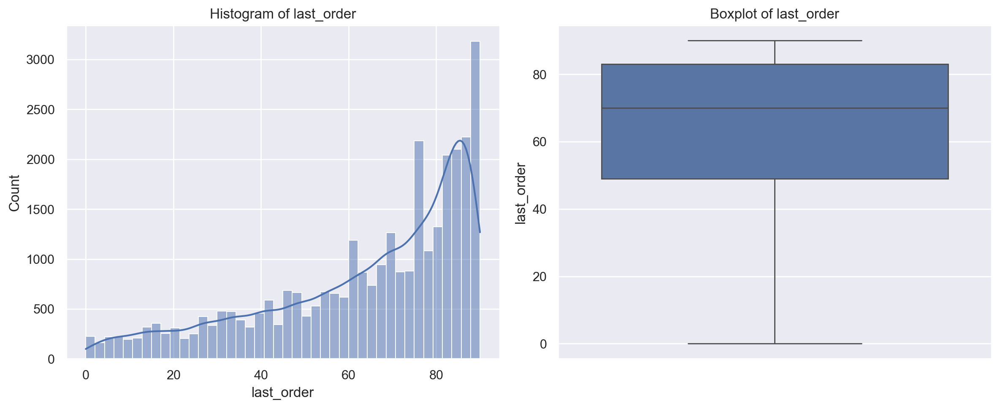

In [729]:
for col in numerical_features:
    print(f" Statistics for column: {col}")
    
    # Calculate key statistics
    mean = df[col].mean()
    median = df[col].median()
    std_dev = df[col].std()
    min_val = df[col].min()
    max_val = df[col].max()
    skewness = df[col].skew()
    kurtosis = df[col].kurt()

    # Display the statistics
    print(f'  Mean: {mean:.2f}')
    print(f'  Median: {median:.2f}')
    print(f'  Standard Deviation: {std_dev:.2f}')
    print(f'  Min: {min_val}')
    print(f'  Max: {max_val}')
    print(f'  Skewness: {skewness:.2f}')
    print(f'  Kurtosis: {kurtosis:.2f}')
    print('-' * 50 )
    
    # Visualization of each Variable
    plt.figure(figsize=(12, 5))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], kde=True)
    plt.title(f'Histogram of {col}')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')

    # Analyze outliers for the specified numerical variables
    outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
    print(f'Count of outliers: {outlier_count}')
    print(f'Percentage of outliers: {outlier_percentage:.2f}%')
    print(f'Lower Lim:{lower_lim}')
    print(f'Upper Lim:{upper_lim}')
    print('-' * 40)
   
    plt.tight_layout()
    plt.show()

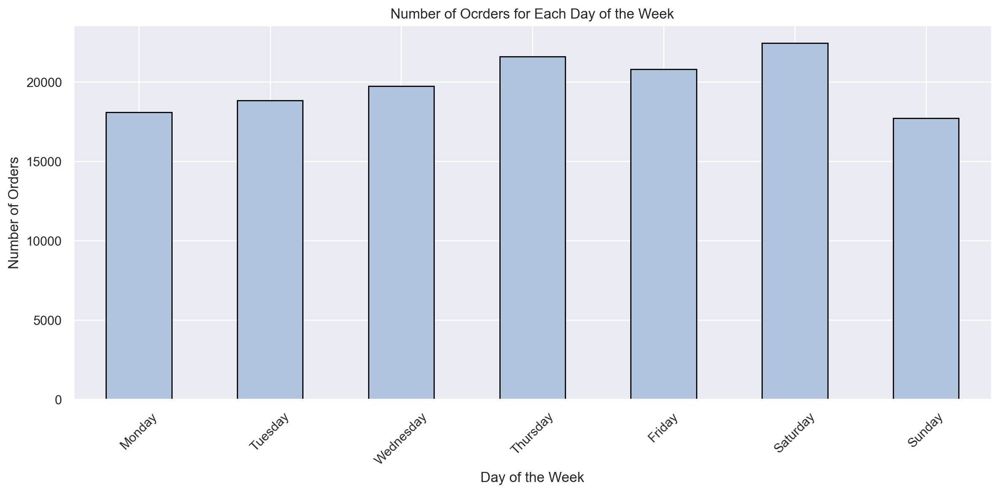

In [730]:
plt.figure(figsize=(12, 6))
DOW_counts.plot(kind='bar', 
                color='lightsteelblue', 
                edgecolor='black')

plt.title('Number of Ocrders for Each Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Orders')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

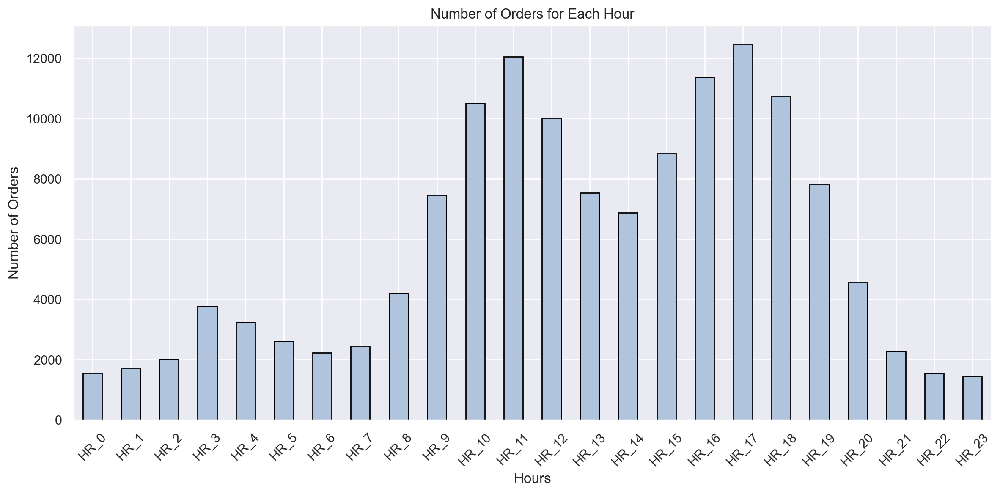

In [731]:
plt.figure(figsize=(12, 6))
HR_counts.plot(kind='bar', 
               color='lightsteelblue', 
               edgecolor='black')

plt.title('Number of Orders for Each Hour')
plt.xlabel('Hours')
plt.ylabel('Number of Orders')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

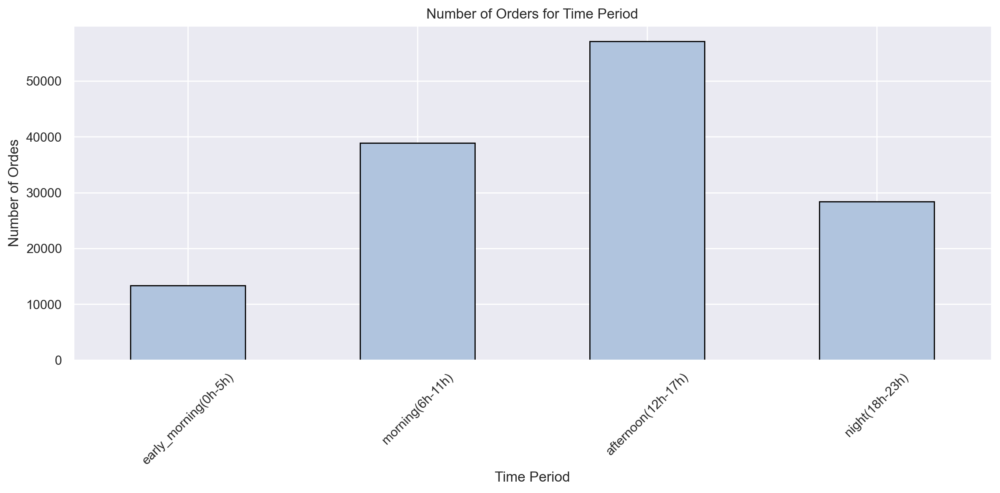

In [732]:
plt.figure(figsize=(12, 6))
time_counts.plot(kind='bar', 
                 color='lightsteelblue', 
                 edgecolor='black')

plt.title('Number of Orders for Time Period')
plt.xlabel('Time Period')
plt.ylabel('Number of Ordes')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

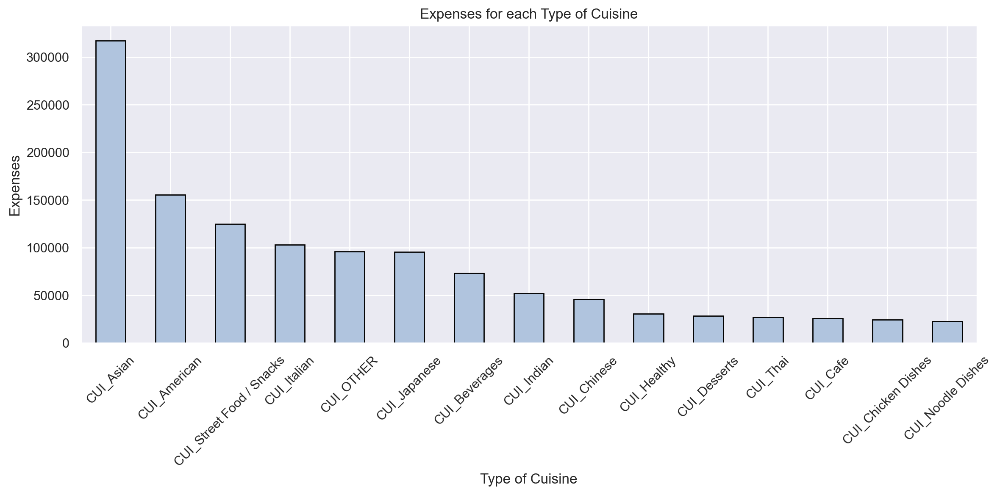

In [733]:
CUI_counts_sorted = CUI_counts.sort_values(ascending=False)

plt.figure(figsize=(12, 6))
CUI_counts_sorted.plot(kind='bar', 
                       color='lightsteelblue', 
                       edgecolor='black')

plt.title('Expenses for each Type of Cuisine')
plt.xlabel('Type of Cuisine')
plt.ylabel('Expenses')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

###
 Pairwise relationships between Numerical Variables


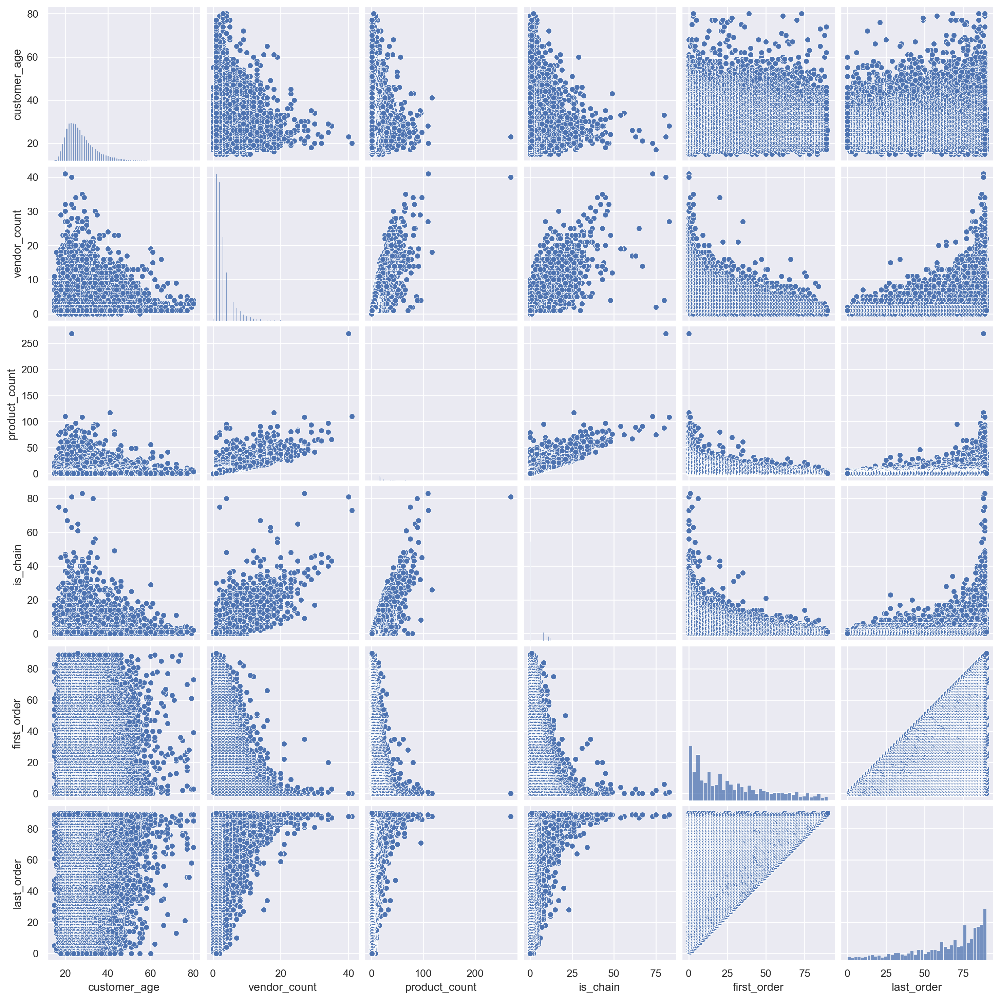

In [734]:
sns.pairplot(df, vars= numerical_features)


## Categorical Features

Analysis for categorical column: customer_region
Frequency counts:
customer_region
8670    9761
4660    9550
2360    8829
2440    1483
4140     857
8370     495
2490     445
-        442
8550      13
Name: count, dtype: int64

--------------------------------------------------



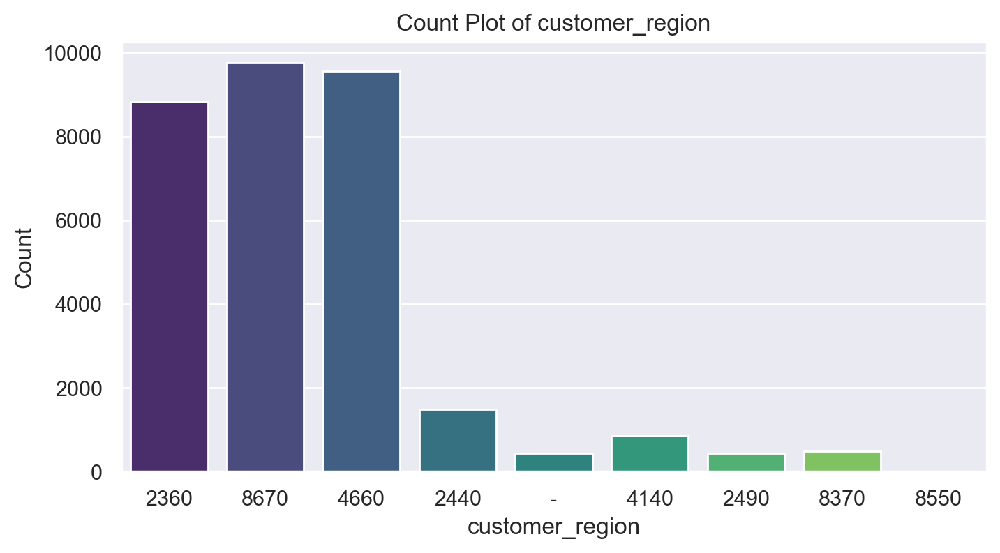

Analysis for categorical column: last_promo
Frequency counts:
last_promo
N0 PROMO    16744
DELIVERY     6282
DISCOUNT     4496
FREEBIE      4353
Name: count, dtype: int64

--------------------------------------------------



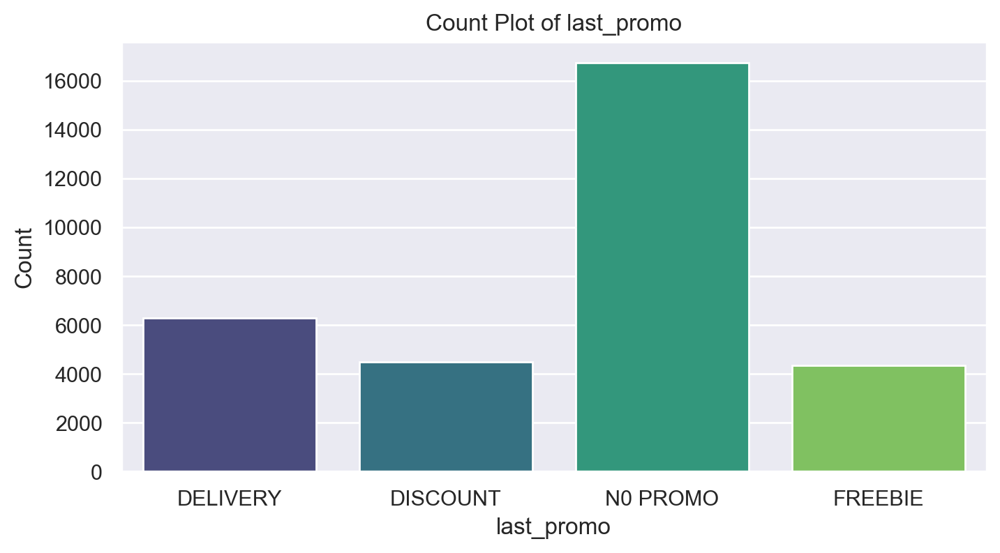

Analysis for categorical column: payment_method
Frequency counts:
payment_method
CARD    20153
DIGI     6098
CASH     5624
Name: count, dtype: int64

--------------------------------------------------



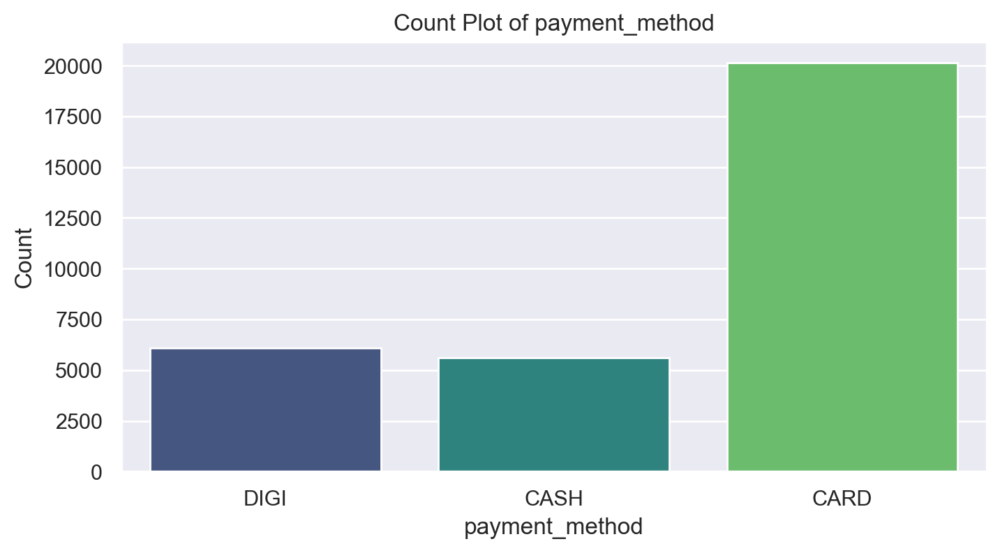

Analysis for categorical column: customer_city_1
Frequency counts:
customer_city_1
2        10757
4        10407
8        10269
Other      442
Name: count, dtype: int64

--------------------------------------------------



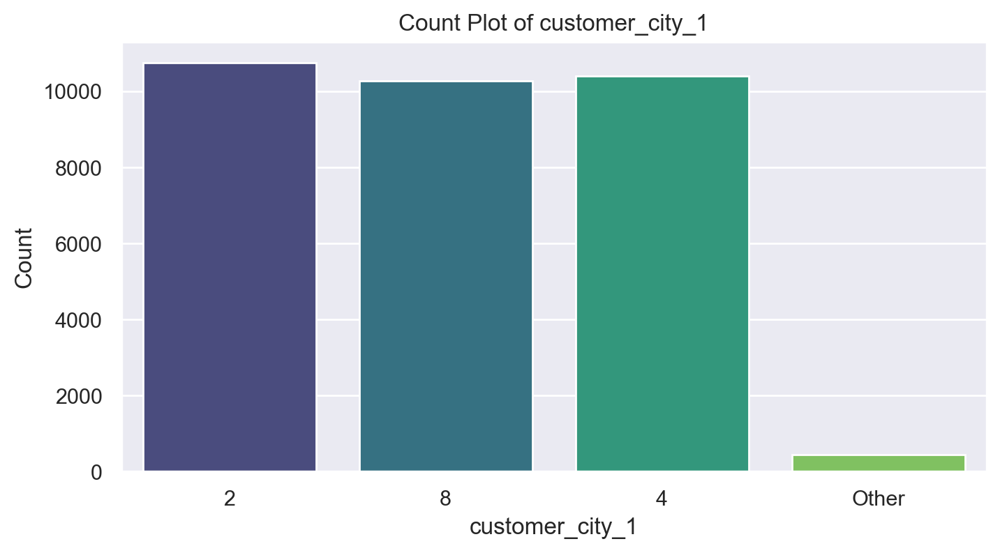

Analysis for categorical column: customer_city_2
Frequency counts:
customer_city_2
City 1    28140
City 2     2340
City 3      953
Other       442
Name: count, dtype: int64

--------------------------------------------------



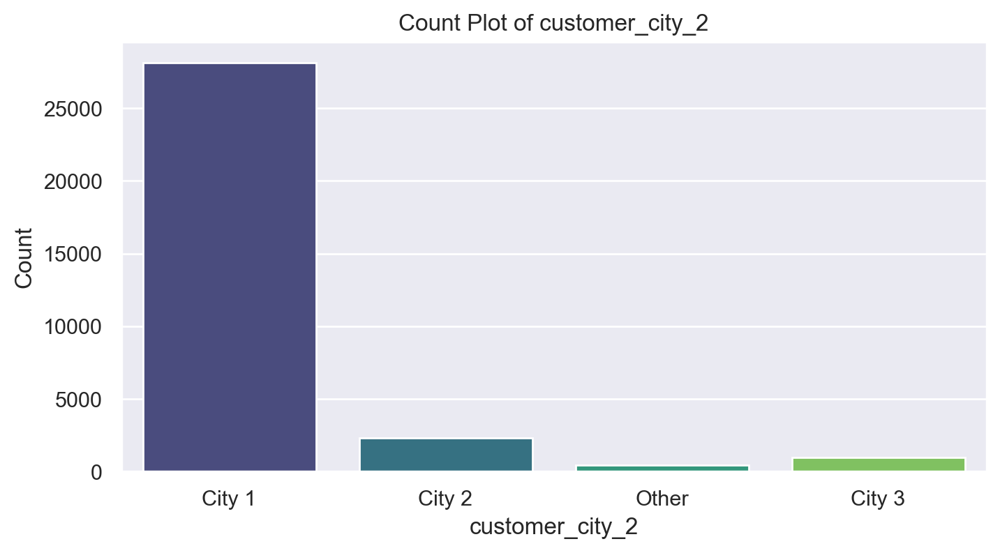

Analysis for categorical column: age_group
Frequency counts:
age_group
Young Adults (20-29)    19786
Adults (30-49)           8908
Teenagers (15-19)        2010
Middle-aged (50-64)       392
Seniors (65-80)            49
Name: count, dtype: int64

--------------------------------------------------



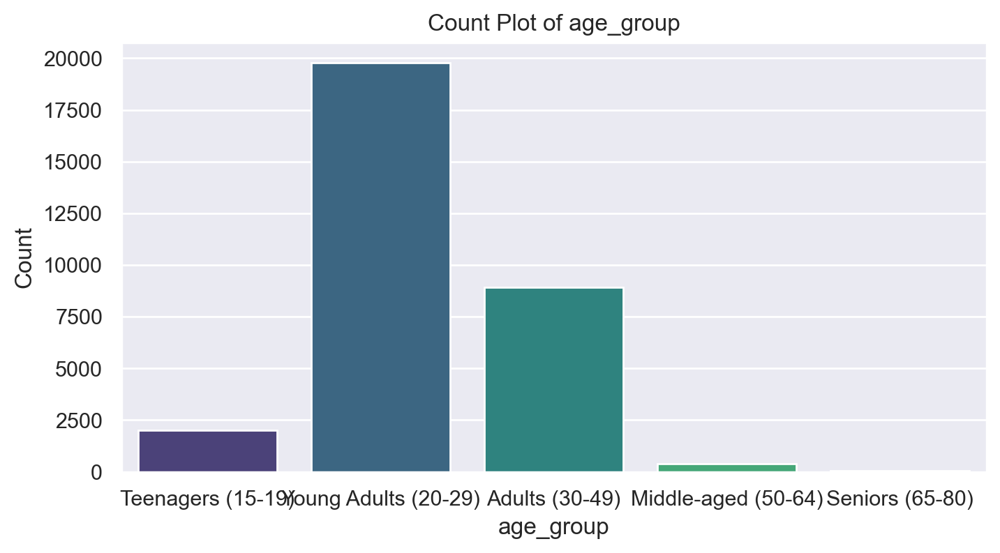

In [735]:
for col in categorical_features:
    print(f"Analysis for categorical column: {col}")
    
    # Calculate frequency counts
    freq_counts = df[col].value_counts()
    
    # Display the frequency counts
    print("Frequency counts:")
    print(freq_counts)
    print("\n" + "-"*50 + "\n")
    
    # Visualization for categorical column
    plt.figure(figsize=(8, 4))
    sns.countplot(x=df[col], palette='viridis')
    plt.title(f'Count Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.show()

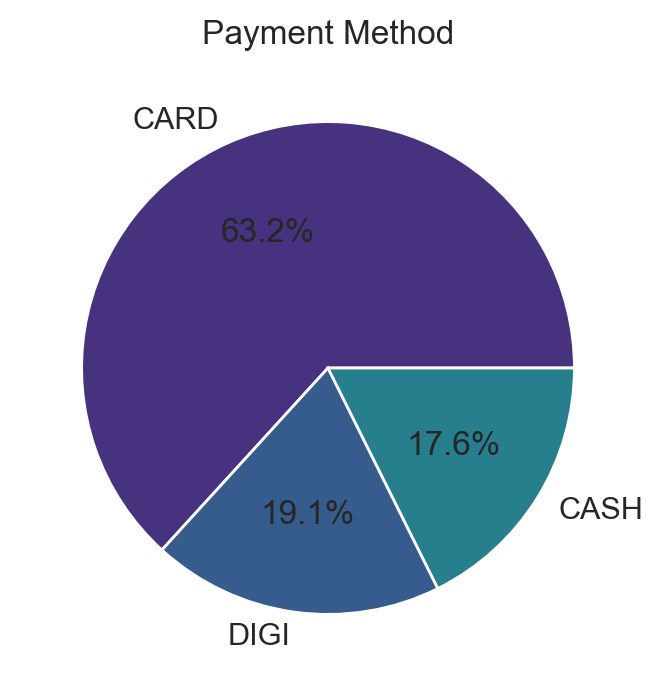

In [736]:
plt.figure(figsize=(8, 6))
payment_method_pie = df['payment_method'].value_counts() \
    .plot (kind='pie', 
           title='Payment Method', 
           autopct='%1.1f%%',
           colors=sns.color_palette("viridis"),
           figsize=(5, 4), 
           ylabel="")

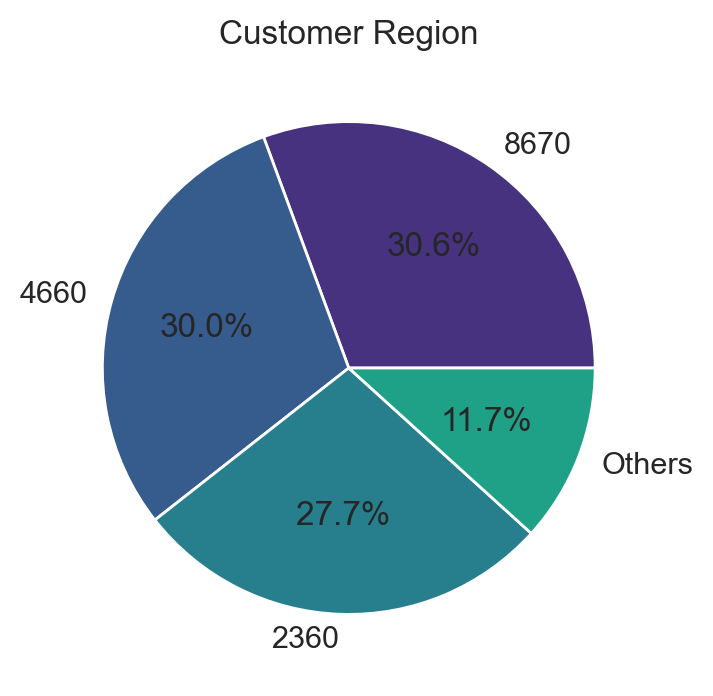

In [737]:
threshold = 0.05 * df['customer_region'].value_counts().sum()

customer_region_counts = df['customer_region'].value_counts()

others = customer_region_counts[customer_region_counts < threshold].sum()

customer_region_counts = customer_region_counts[customer_region_counts >= threshold]
customer_region_counts['Others'] = others

plt.figure(figsize=(8, 6))
customer_region = customer_region_counts \
    .plot (kind='pie', 
           title='Customer Region', 
           autopct='%1.1f%%',
           colors=sns.color_palette("viridis"),
           figsize=(5, 4), 
           ylabel="")


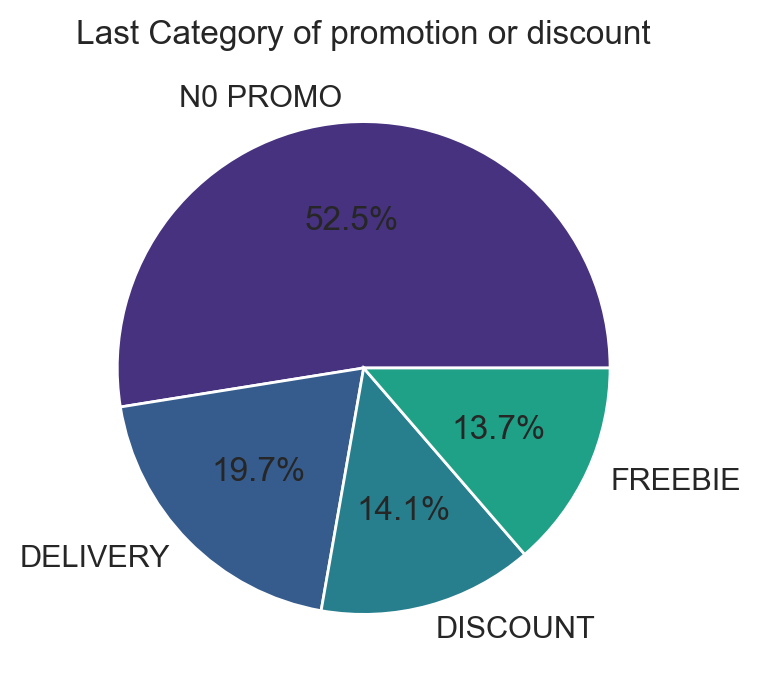

In [738]:
plt.figure(figsize=(8, 6))

#promo_df = df['last_promo'].apply(lambda x: 'NO PROMO' if(x=='-') else x  )
promo_category = df['last_promo'].value_counts() \
    .plot (kind='pie', 
           title='Last Category of promotion or discount', 
           autopct='%1.1f%%',
           colors=sns.color_palette("viridis"),
           figsize=(5, 4), 
           ylabel="")


# 4. Feature Relationships

## New Features

####
We decided to create a new variable called cuisine_diversity to measure the variety of cuisines each customer orders from. This variable will help us analyze which age groups or regions tend to explore a wider range of cuisines, indicating openness to new experiences. Conversely, it will allow us to identify customers who stick to fewer options, showing a strong preference for specific types of cuisine

In [739]:
# Cuisine diversity (number of different cuisines ordered)
df['cuisine_diversity'] = (df[CUI_columns] > 0).sum(axis=1)

  Mean: 2.28
  Median: 2.00
  Standard Deviation: 1.48
  Min: 0
  Max: 13
  Skewness: 1.67
  Kurtosis: 3.74
--------------------------------------------------
Count of outliers: 662
Percentage of outliers: 2.08%
Lower Lim:-2.0
Upper Lim:6.0
----------------------------------------


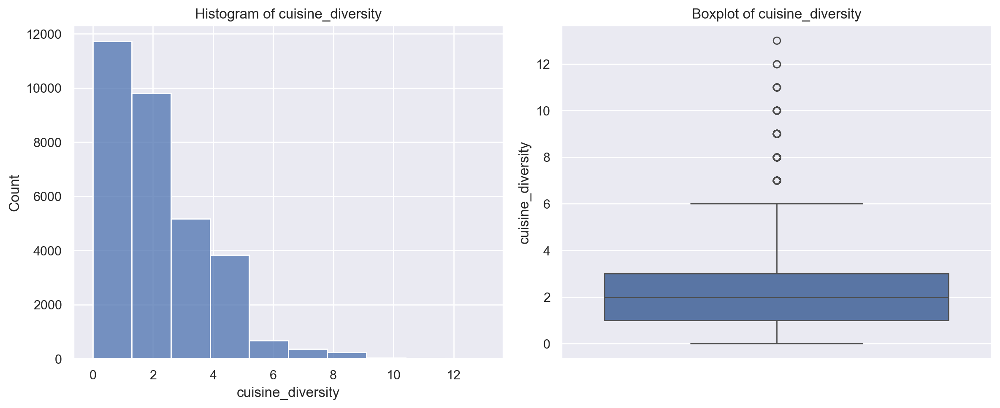

In [740]:
col='cuisine_diversity'
# Calculate key statistics
mean = df[col].mean()
median = df[col].median()
std_dev = df[col].std()
min_val = df[col].min()
max_val = df[col].max()
skewness = df[col].skew()
kurtosis = df[col].kurt()

# Display the statistics
print(f'  Mean: {mean:.2f}')
print(f'  Median: {median:.2f}')
print(f'  Standard Deviation: {std_dev:.2f}')
print(f'  Min: {min_val}')
print(f'  Max: {max_val}')
print(f'  Skewness: {skewness:.2f}')
print(f'  Kurtosis: {kurtosis:.2f}')
print('-' * 50 )
    
# Visualization of each Variable
plt.figure(figsize=(12, 5))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df[col], bins=10)
plt.title(f'Histogram of {col}')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=df[col])
plt.title(f'Boxplot of {col}')

# Analyze outliers for the specified numerical variables
outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
print(f'Count of outliers: {outlier_count}')
print(f'Percentage of outliers: {outlier_percentage:.2f}%')
print(f'Lower Lim:{lower_lim}')
print(f'Upper Lim:{upper_lim}')
print('-' * 40)
   
plt.tight_layout()
plt.show()

####
We decided to create a new variable called total_spend to measure the overall spending of customers across different age groups and regions. This variable will help us analyze which age groups and regions have a higher capacity and willingness to spend on food orders through the app.

In [741]:
# Total spend per customer
df['total_spend'] = df[CUI_columns].sum(axis=1)

  Mean: 38.30
  Median: 24.14
  Standard Deviation: 46.41
  Min: 0.0
  Max: 1418.33
  Skewness: 4.81
  Kurtosis: 53.81
--------------------------------------------------
Count of outliers: 2620
Percentage of outliers: 8.22%
Lower Lim:-35.25499999999999
Upper Lim:93.10499999999999
----------------------------------------


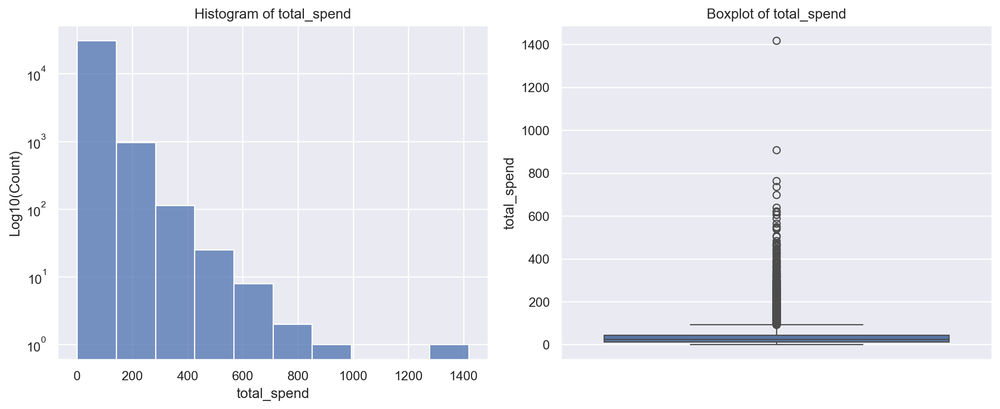

In [742]:
col='total_spend'
# Calculate key statistics
mean = df[col].mean()
median = df[col].median()
std_dev = df[col].std()
min_val = df[col].min()
max_val = df[col].max()
skewness = df[col].skew()
kurtosis = df[col].kurt()

# Display the statistics
print(f'  Mean: {mean:.2f}')
print(f'  Median: {median:.2f}')
print(f'  Standard Deviation: {std_dev:.2f}')
print(f'  Min: {min_val}')
print(f'  Max: {max_val}')
print(f'  Skewness: {skewness:.2f}')
print(f'  Kurtosis: {kurtosis:.2f}')
print('-' * 50 )
    
# Visualization of each Variable
plt.figure(figsize=(12, 5))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df[col], bins=10, log=True)
plt.ylabel('Log10(Count)')
plt.title(f'Histogram of {col}')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=df[col])
plt.title(f'Boxplot of {col}')

# Analyze outliers for the specified numerical variables
outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
print(f'Count of outliers: {outlier_count}')
print(f'Percentage of outliers: {outlier_percentage:.2f}%')
print(f'Lower Lim:{lower_lim}')
print(f'Upper Lim:{upper_lim}')
print('-' * 40)
   
plt.tight_layout()
plt.show()

####
Analyze the Sum_of_Orders Variable, creating in the beginning, that indicates the total orders by customer. 

  Mean: 4.37
  Median: 3.00
  Standard Deviation: 5.08
  Min: 0
  Max: 94
  Skewness: 4.53
  Kurtosis: 37.00
--------------------------------------------------


Count of outliers: 3027
Percentage of outliers: 9.50%
Lower Lim:-2.5
Upper Lim:9.5
----------------------------------------


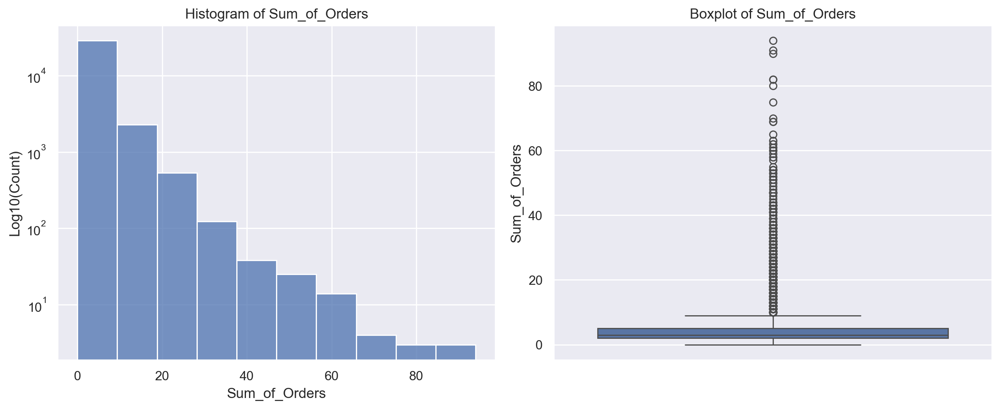

In [743]:
col='Sum_of_Orders'
# Calculate key statistics
mean = df[col].mean()
median = df[col].median()
std_dev = df[col].std()
min_val = df[col].min()
max_val = df[col].max()
skewness = df[col].skew()
kurtosis = df[col].kurt()

# Display the statistics
print(f'  Mean: {mean:.2f}')
print(f'  Median: {median:.2f}')
print(f'  Standard Deviation: {std_dev:.2f}')
print(f'  Min: {min_val}')
print(f'  Max: {max_val}')
print(f'  Skewness: {skewness:.2f}')
print(f'  Kurtosis: {kurtosis:.2f}')
print('-' * 50 )
    
# Visualization of each Variable
plt.figure(figsize=(12, 5))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df[col], bins=10, log=True)
plt.ylabel('Log10(Count)')
plt.title(f'Histogram of {col}')

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(y=df[col])
plt.title(f'Boxplot of {col}')

# Analyze outliers for the specified numerical variables
outlier_count, outlier_percentage, lower_lim, upper_lim = analyze_outliers(df[col])
  
print(f'Count of outliers: {outlier_count}')
print(f'Percentage of outliers: {outlier_percentage:.2f}%')
print(f'Lower Lim:{lower_lim}')
print(f'Upper Lim:{upper_lim}')
print('-' * 40)
   
plt.tight_layout()
plt.show()

## Correlations and Heatmaps

In [744]:
df_corr = df[['customer_age', 
              'vendor_count',
               'product_count', 
              'is_chain', 
              'first_order', 
              'last_order'
             ]].corr()
df_corr

,customer_age,vendor_count,product_count,is_chain,first_order,last_order
customer_age,1.000000,0.000982,0.005413,0.001756,0.004723,0.012719
vendor_count,0.000982,1.000000,0.827602,0.762893,-0.386768,0.377495
product_count,0.005413,0.827602,1.000000,0.827070,-0.358571,0.350341
is_chain,0.001756,0.762893,0.827070,1.000000,-0.331123,0.298202
first_order,0.004723,-0.386768,-0.358571,-0.331123,1.000000,0.219877
last_order,0.012719,0.377495,0.350341,0.298202,0.219877,1.000000


Text(0.5, 1.0, 'Correlation Heatmap between numerical variables')

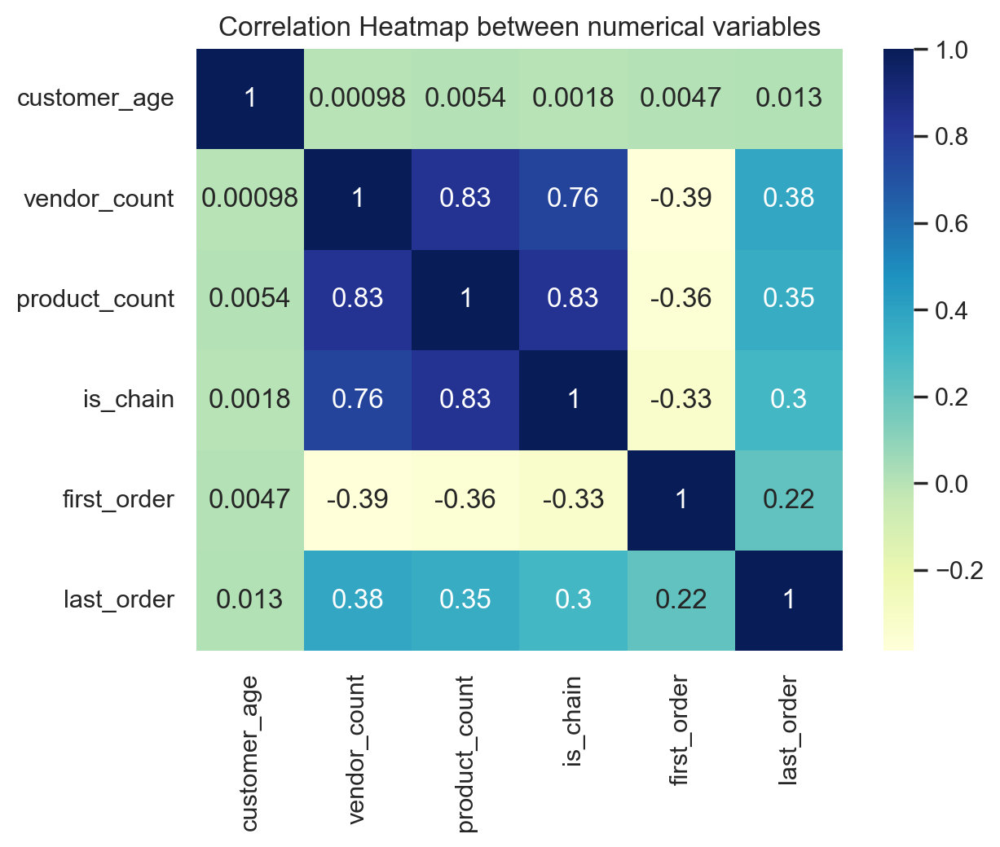

In [745]:
sns.heatmap(df_corr, 
            annot=True, 
            cmap='YlGnBu')

plt.title('Correlation Heatmap between numerical variables', fontsize=12)

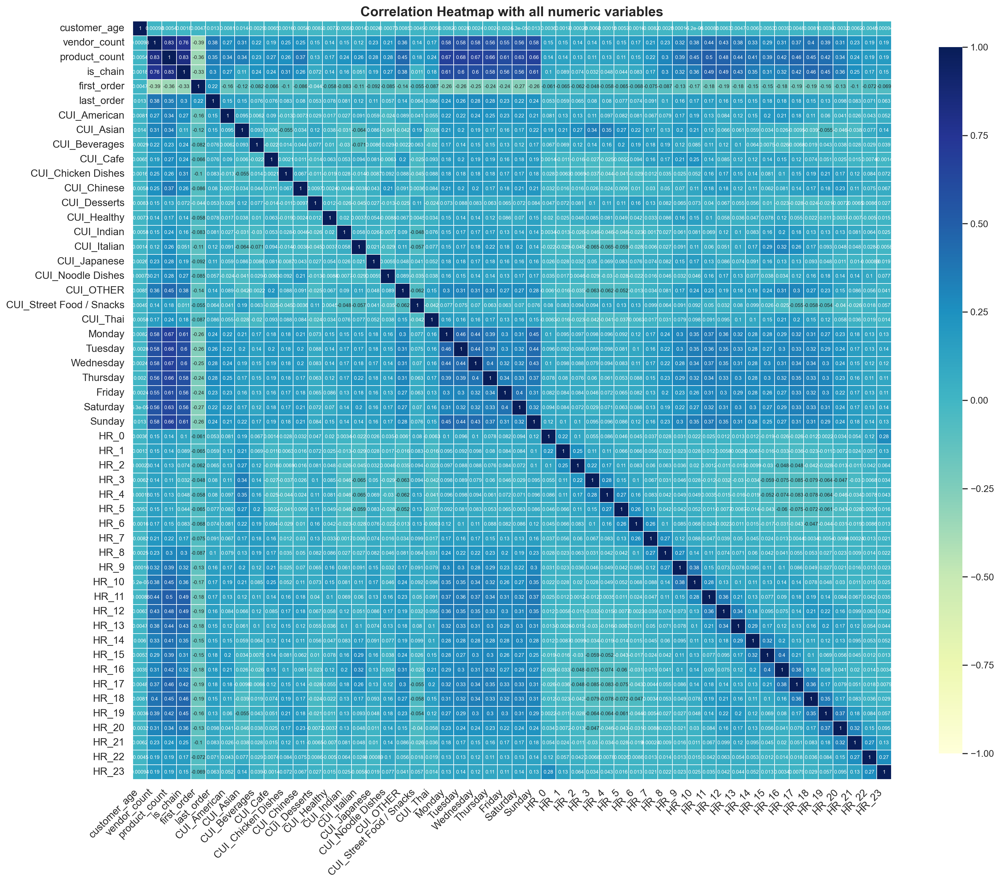

In [746]:
df_corr_all=df[['customer_age', 'vendor_count',
       'product_count', 'is_chain', 'first_order', 'last_order', 'CUI_American', 'CUI_Asian', 'CUI_Beverages',
       'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts',
       'CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 'CUI_Japanese',
       'CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food / Snacks',
       'CUI_Thai', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday',
       'Saturday', 'Sunday', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5',
       'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13',
       'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21',
       'HR_22', 'HR_23']].corr()

plt.figure(figsize=(20, 20)) 


sns.heatmap(df_corr_all, annot=True,
            linewidths=0.7, vmin=-1, vmax=1, square=True,
            cbar_kws={'shrink': 0.75, 'aspect': 30}, 
            annot_kws={'size': 6 },  
            cmap='YlGnBu')  

plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)

plt.title('Correlation Heatmap with all numeric variables', fontsize=16, weight='bold')

plt.show()

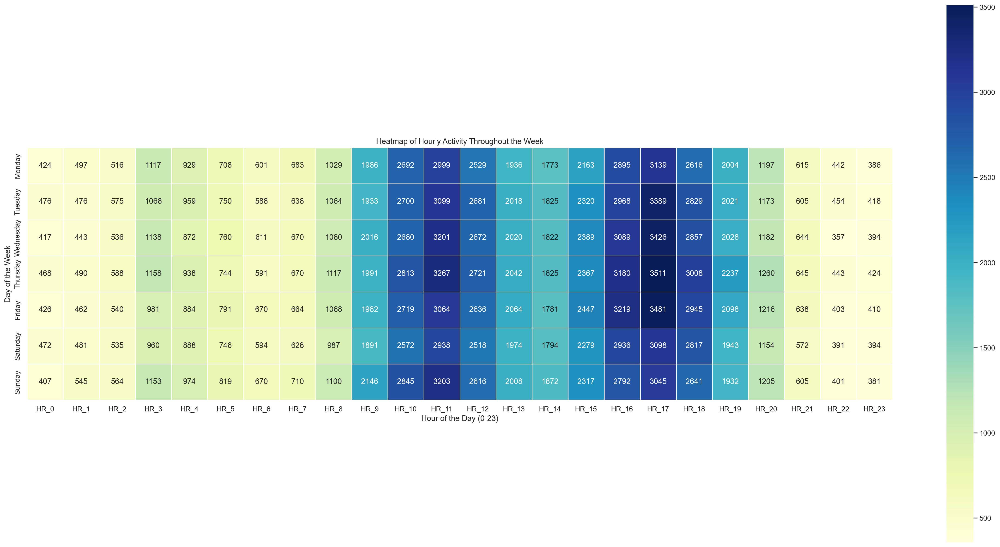

In [747]:
# Create an empty DataFrame to store the aggregated activity, initializing with zeros
heatmap_data = pd.DataFrame(index=dow_columns, columns=hr_columns)

# Sum of the hourly activity for each day and fill in the heatmap data
for day in dow_columns:
    # Summing the hourly columns for the current day and filling NaNs with zero
    heatmap_data.loc[day] = df.loc[df[day] == 1, hr_columns].sum().fillna(0)

# Convert all data to numeric (float)
heatmap_data = heatmap_data.astype(float)

# Plot the heatmap
plt.figure(figsize=(30, 15))
sns.heatmap(heatmap_data, 
            cmap="YlGnBu", 
            linewidths=1, 
            annot=True, 
            square=True, 
            fmt='.0f')
plt.title('Heatmap of Hourly Activity Throughout the Week')
plt.xlabel('Hour of the Day (0-23)')
plt.ylabel('Day of the Week')
plt.show()


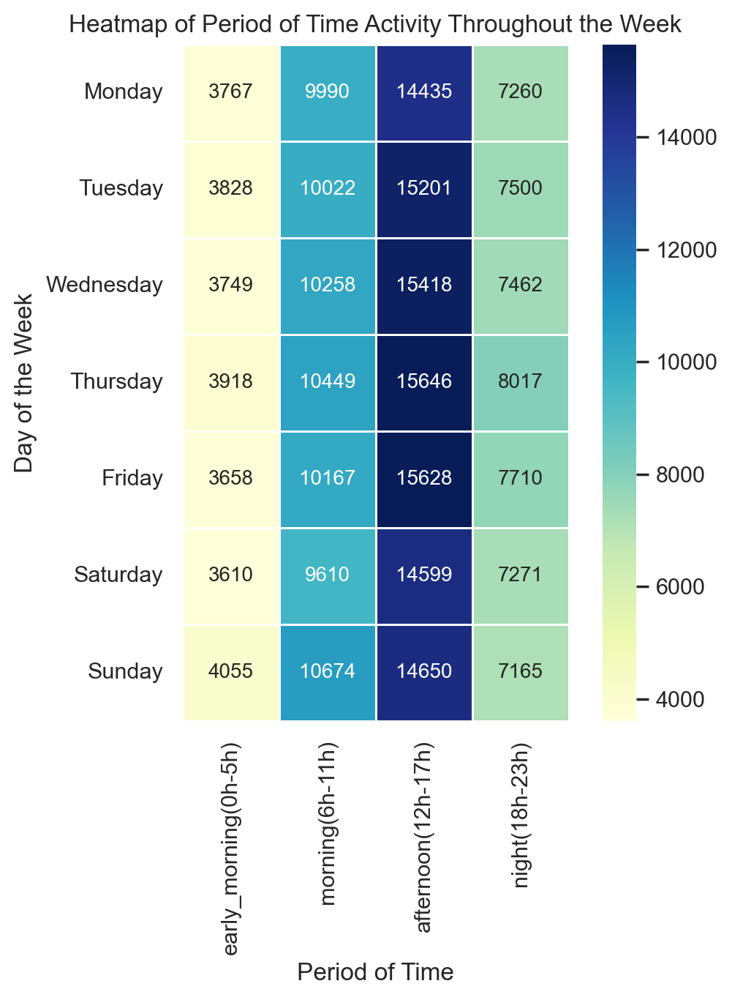

In [748]:
# Create an empty DataFrame to store the aggregated activity, initializing with zeros
heatmap_data = pd.DataFrame(index=dow_columns, columns=time_columns)

# Sum the hourly activity for each day and fill in the heatmap data
for day in dow_columns:
    # Summing the hourly columns for the current day and filling NaNs with zero
    heatmap_data.loc[day] = df.loc[df[day] == 1, time_columns].sum().fillna(0)

# Convert all data to numeric (float)
heatmap_data = heatmap_data.astype(float)

# Plot the heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(heatmap_data, 
            cmap="YlGnBu", 
            linewidths=0.5, 
            annot=True, 
            square=True,
            annot_kws={'size': 10 }, 
            fmt='.0f')
plt.title('Heatmap of Period of Time Activity Throughout the Week')
plt.xlabel('Period of Time')
plt.ylabel('Day of the Week')
plt.show()

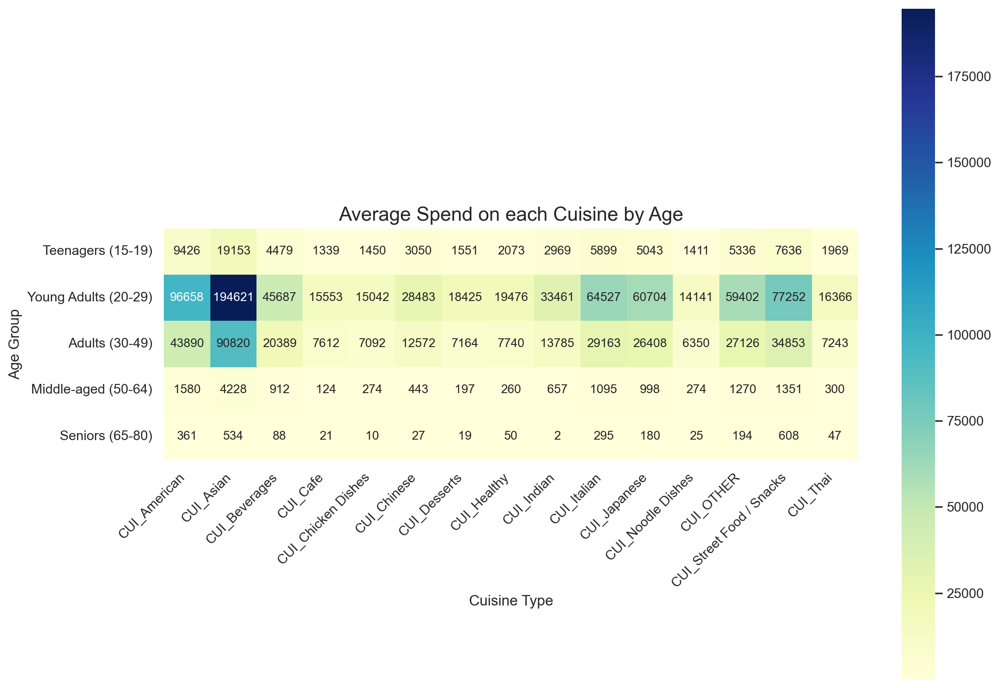

In [749]:
cuisine_by_age = df.groupby('age_group')[CUI_columns].sum()

plt.figure(figsize=(12, 8))
sns.heatmap(cuisine_by_age, 
            annot=True,
            annot_kws={'size': 10 }, 
            cmap="YlGnBu", 
            fmt='.0f', 
            square=True)

plt.title('Average Spend on each Cuisine by Age', fontsize=16)
plt.xlabel('Cuisine Type', fontsize=12)
plt.ylabel('Age Group', fontsize=12)


plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


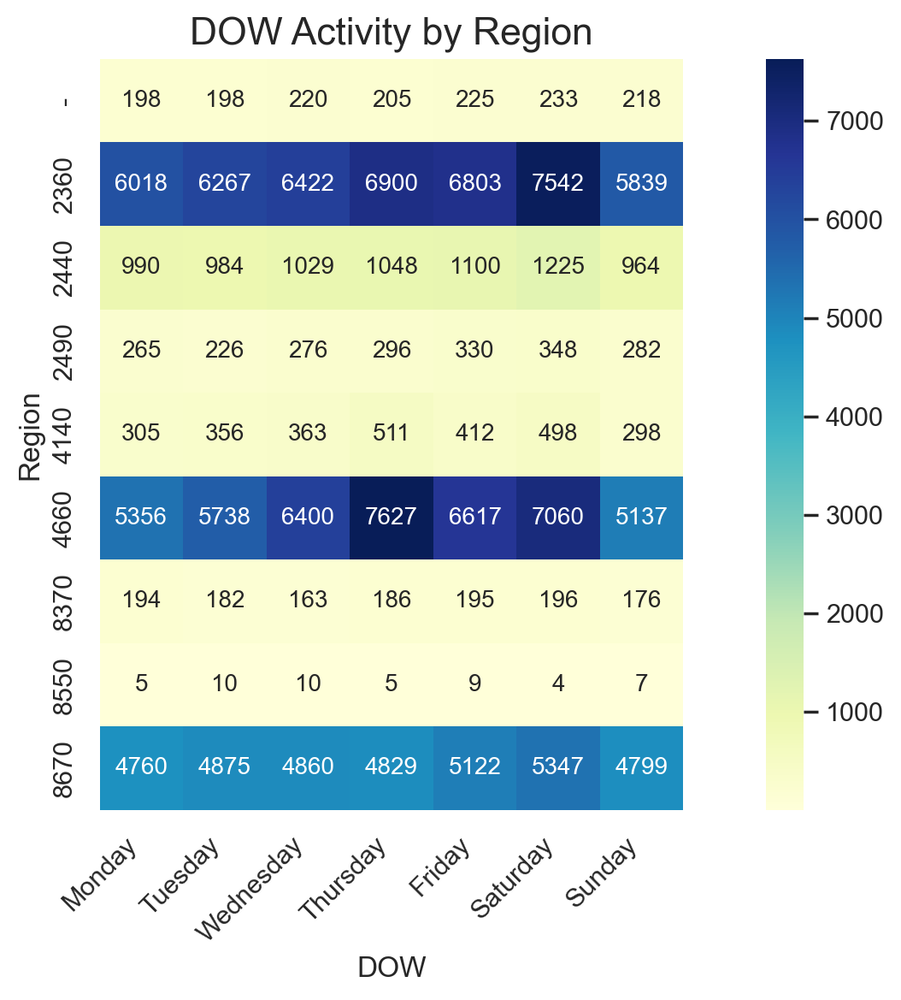

In [774]:
# Group by region and sum the DOW
cuisine_by_region = df.groupby('customer_region')[dow_columns].sum()  
plt.figure(figsize=(10, 6))
sns.heatmap(cuisine_by_region, 
            annot=True,
            annot_kws={'size': 10}, 
            cmap="YlGnBu", 
            fmt='.0f', 
            square=True)

plt.title('DOW Activity by Region', fontsize=16)
plt.xlabel('DOW', fontsize=12)  # Update this label to match the context of your hours data
plt.ylabel('Region', fontsize=12)

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## Multivariate Analysis

### Payment Method

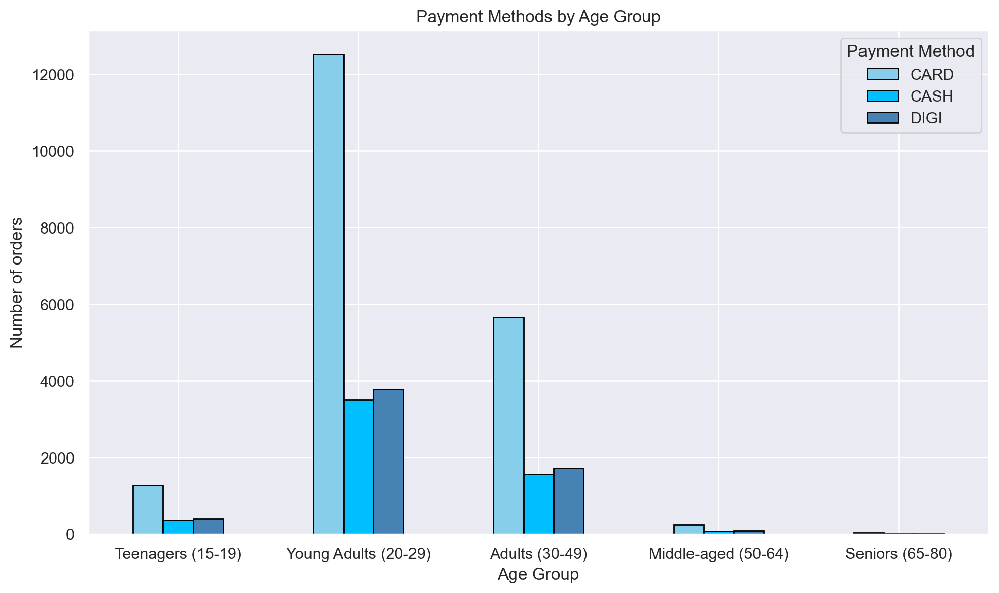

In [750]:
payment_counts = df.groupby(['age_group', 'payment_method']).size().unstack(fill_value=0)

colors=['#87CEEB','#00BFFF','#4682B4']
payment_counts.plot(kind='bar', 
                    stacked=False, 
                    figsize=(10, 6), 
                    color=colors, 
                    edgecolor='black') 

plt.title('Payment Methods by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Number of orders')
plt.xticks(rotation=0)  
plt.legend(title='Payment Method')
plt.tight_layout()  
plt.show()

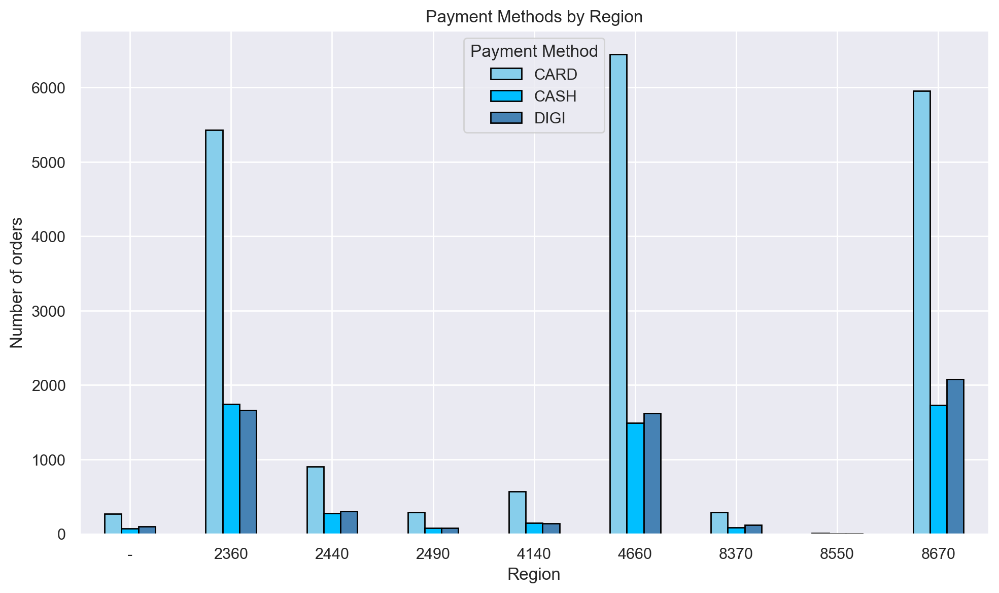

In [751]:
payment_counts_region = df.groupby(['customer_region', 'payment_method']).size().unstack(fill_value=0)

colors=['#87CEEB','#00BFFF','#4682B4']
payment_counts_region.plot(kind='bar', 
                    stacked=False, 
                    figsize=(10, 6), 
                    color=colors, 
                    edgecolor='black') 

plt.title('Payment Methods by Region')
plt.xlabel('Region')
plt.ylabel('Number of orders')
plt.xticks(rotation=0)  
plt.legend(title='Payment Method')
plt.tight_layout()  
plt.show()

### Age Group

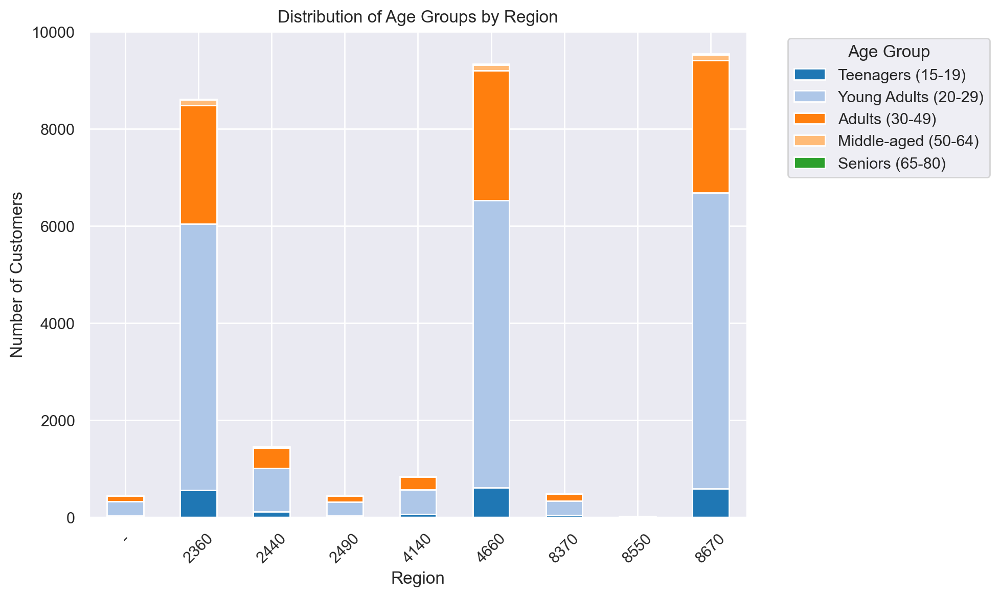

In [752]:
# Grouping data by region and age group
age_counts = df.groupby(['customer_region', 'age_group']).size().reset_index(name='count')

# Creating a pivot table
pivot_age_counts = age_counts.pivot(index='customer_region', columns='age_group', values='count').fillna(0)

# Plotting the stacked bar chart
pivot_age_counts.plot(kind='bar', 
                      stacked=True, 
                      figsize=(10, 6), 
                      color=plt.cm.tab20.colors) # Ensuring the color palette is correct

plt.title('Distribution of Age Groups by Region')
plt.xlabel('Region')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)  
plt.legend(title='Age Group', bbox_to_anchor=(1.05, 1), loc='upper left')  
plt.tight_layout()  
plt.show()

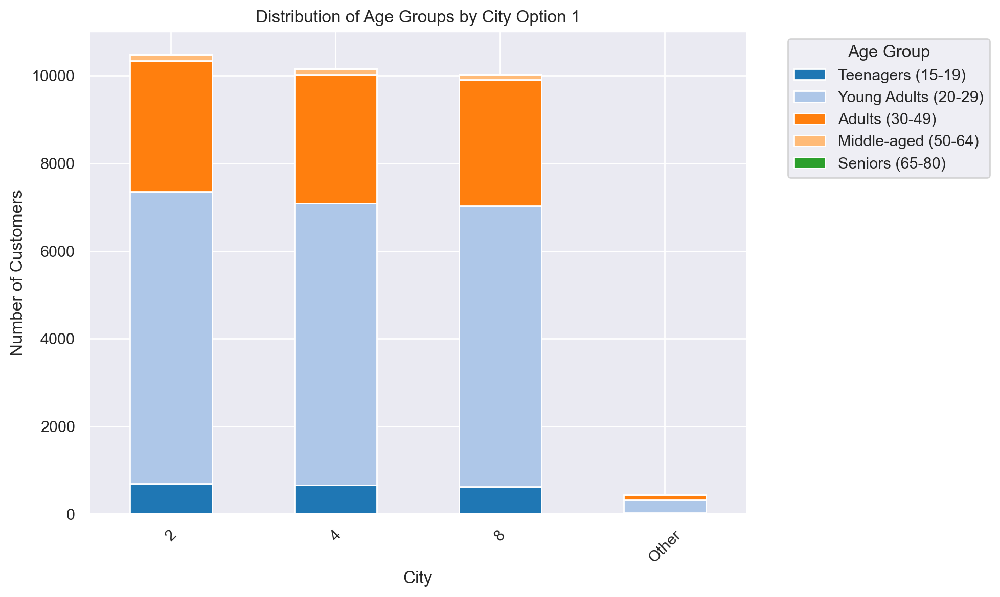

In [760]:
# Grouping data by city and age group
age_counts_city = df.groupby(['customer_city_1', 'age_group']).size().reset_index(name='count')

# Create the stacked bar plot
age_counts_city_pivot = age_counts_city.pivot(index='customer_city_1', columns='age_group', values='count').fillna(0)

age_counts_city_pivot.plot(kind='bar', 
                            stacked=True, 
                            figsize=(10, 6),
                            color=plt.cm.tab20.colors) # Ensuring the color palette is correct
plt.title('Distribution of Age Groups by City Option 1')
plt.xlabel('City')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)  
plt.legend(title='Age Group', bbox_to_anchor=(1.05, 1), loc='upper left')  
plt.tight_layout()  
plt.show()

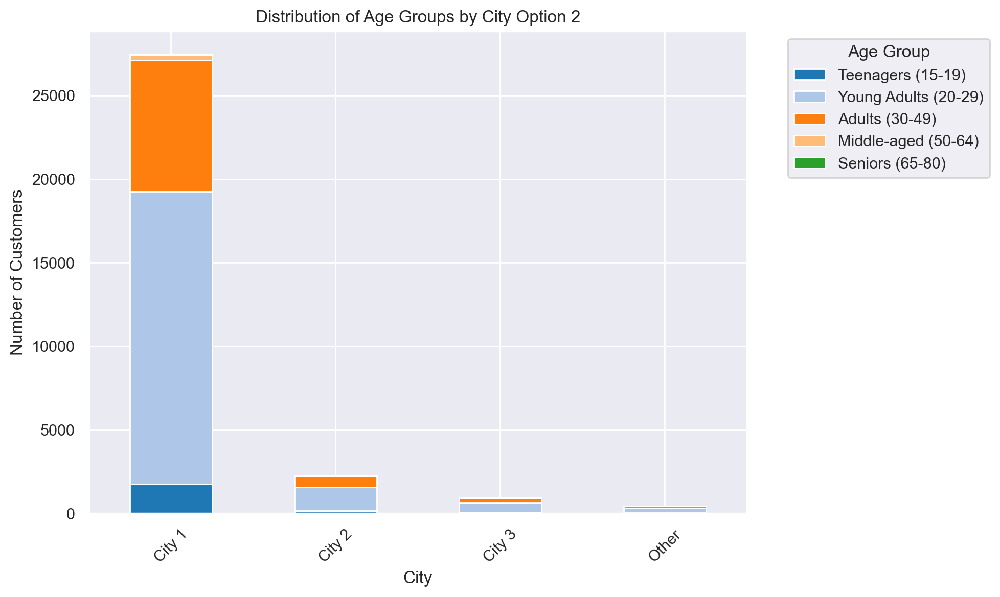

In [761]:
# Grouping data by city and age group
age_counts_city = df.groupby(['customer_city_2', 'age_group']).size().reset_index(name='count')

# Create the stacked bar plot
age_counts_city_pivot = age_counts_city.pivot(index='customer_city_2', columns='age_group', values='count').fillna(0)

age_counts_city_pivot.plot(kind='bar', 
                            stacked=True, 
                            figsize=(10, 6),
                            color=plt.cm.tab20.colors) # Ensuring the color palette is correct
plt.title('Distribution of Age Groups by City Option 2')
plt.xlabel('City')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)  
plt.legend(title='Age Group', bbox_to_anchor=(1.05, 1), loc='upper left')  
plt.tight_layout()  
plt.show()

### Cuisine Type

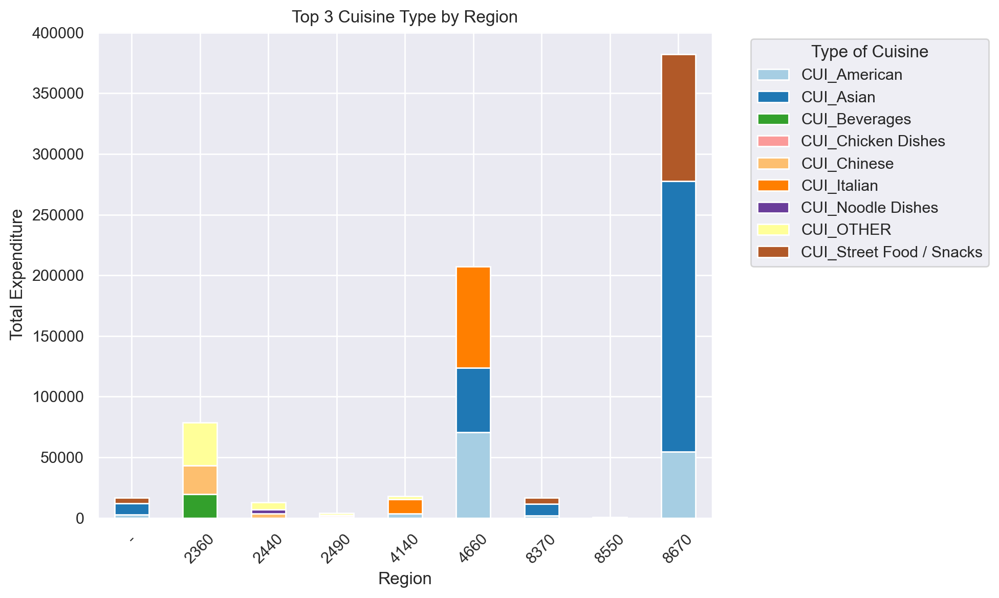

In [755]:
cuisine_counts = df.groupby('customer_region')[CUI_columns].sum().reset_index()

cuisine_counts_melted = cuisine_counts.melt(id_vars='customer_region', 
                                            value_vars=CUI_columns, 
                                            var_name='cuisine_type', 
                                            value_name='total_expenditure')

top_cuisines = (
    cuisine_counts_melted.groupby('customer_region')
    .apply(lambda x: x.nlargest(3, 'total_expenditure'))
    .reset_index(drop=True)
)


top_cuisine_counts = top_cuisines.pivot(index='customer_region', 
                                        columns='cuisine_type', 
                                        values='total_expenditure').fillna(0)


num_cuisines = top_cuisine_counts.shape[1]
colors = plt.cm.Paired(np.linspace(0, 1, num_cuisines)) 


top_cuisine_counts.plot(kind='bar', 
                        stacked=True, 
                        figsize=(10, 6), 
                        color=colors)

plt.title('Top 3 Cuisine Type by Region')
plt.xlabel('Region')
plt.ylabel('Total Expenditure')
plt.xticks(rotation=45)
plt.legend(title='Type of Cuisine', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


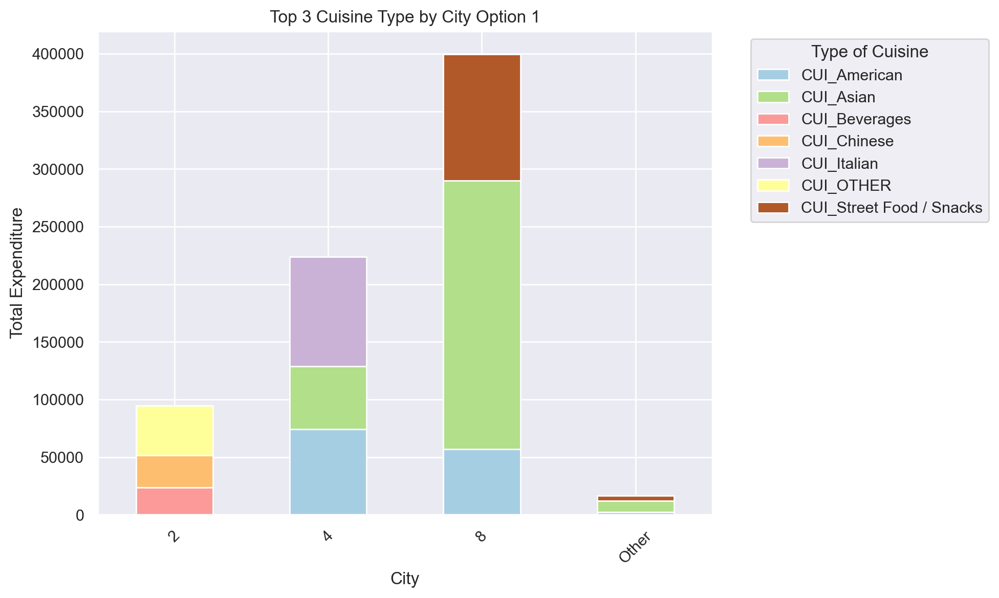

In [762]:
cuisine_counts = df.groupby('customer_city_1')[CUI_columns].sum().reset_index()

cuisine_counts_melted = cuisine_counts.melt(id_vars='customer_city_1', 
                                            value_vars=CUI_columns, 
                                            var_name='cuisine_type', 
                                            value_name='total_expenditure')

top_cuisines = (
    cuisine_counts_melted.groupby('customer_city_1')
    .apply(lambda x: x.nlargest(3, 'total_expenditure'))
    .reset_index(drop=True)
)


top_cuisine_counts = top_cuisines.pivot(index='customer_city_1', 
                                        columns='cuisine_type', 
                                        values='total_expenditure').fillna(0)


num_cuisines = top_cuisine_counts.shape[1]
colors = plt.cm.Paired(np.linspace(0, 1, num_cuisines)) 


top_cuisine_counts.plot(kind='bar', 
                        stacked=True, 
                        figsize=(10, 6), 
                        color=colors)

plt.title('Top 3 Cuisine Type by City Option 1')
plt.xlabel('City')
plt.ylabel('Total Expenditure')
plt.xticks(rotation=45)
plt.legend(title='Type of Cuisine', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


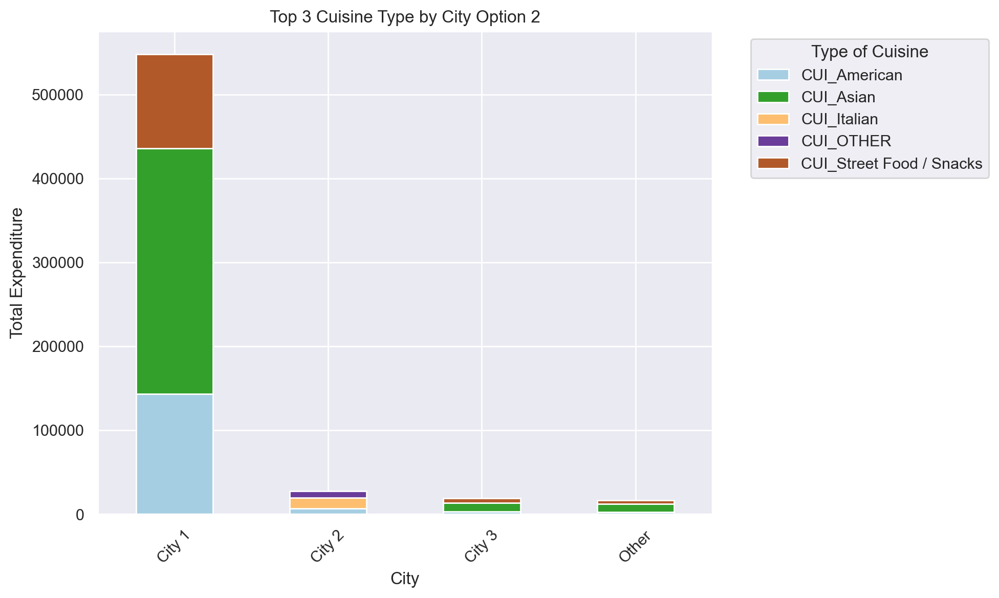

In [763]:
cuisine_counts = df.groupby('customer_city_2')[CUI_columns].sum().reset_index()

cuisine_counts_melted = cuisine_counts.melt(id_vars='customer_city_2', 
                                            value_vars=CUI_columns, 
                                            var_name='cuisine_type', 
                                            value_name='total_expenditure')

top_cuisines = (
    cuisine_counts_melted.groupby('customer_city_2')
    .apply(lambda x: x.nlargest(3, 'total_expenditure'))
    .reset_index(drop=True)
)


top_cuisine_counts = top_cuisines.pivot(index='customer_city_2', 
                                        columns='cuisine_type', 
                                        values='total_expenditure').fillna(0)


num_cuisines = top_cuisine_counts.shape[1]
colors = plt.cm.Paired(np.linspace(0, 1, num_cuisines)) 


top_cuisine_counts.plot(kind='bar', 
                        stacked=True, 
                        figsize=(10, 6), 
                        color=colors)

plt.title('Top 3 Cuisine Type by City Option 2')
plt.xlabel('City')
plt.ylabel('Total Expenditure')
plt.xticks(rotation=45)
plt.legend(title='Type of Cuisine', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### Total Spending

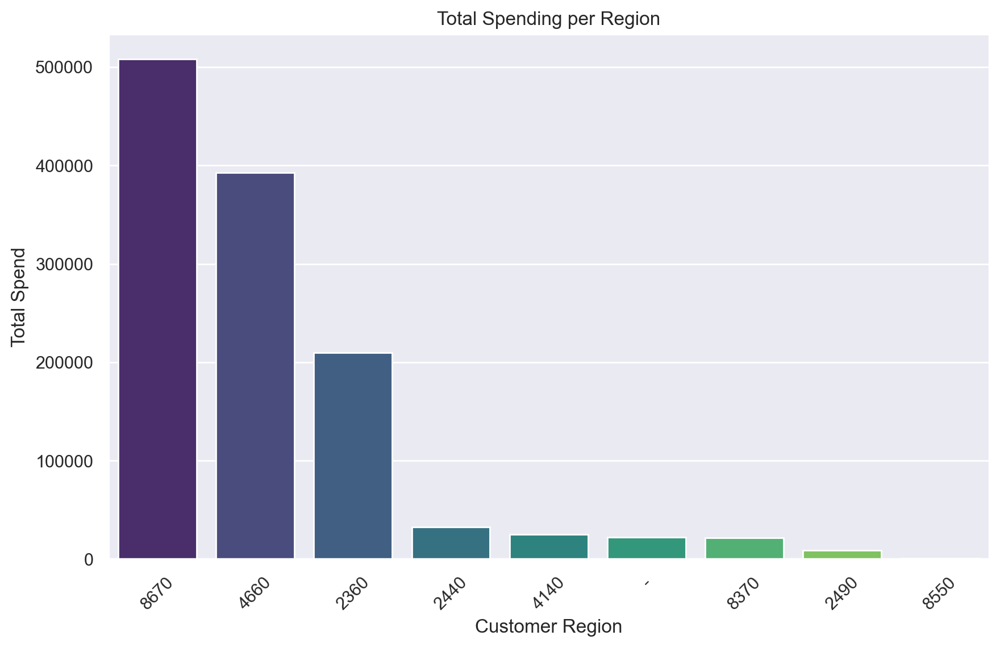

In [758]:
# Group by region and sum the total spending
region_spend = df.groupby('customer_region')['total_spend'].sum().reset_index()

region_spend = region_spend.sort_values(by='total_spend', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='customer_region', y='total_spend', data=region_spend, palette="viridis")

plt.title("Total Spending per Region")
plt.xlabel("Customer Region")
plt.ylabel("Total Spend")
plt.xticks(rotation=45)
plt.show()

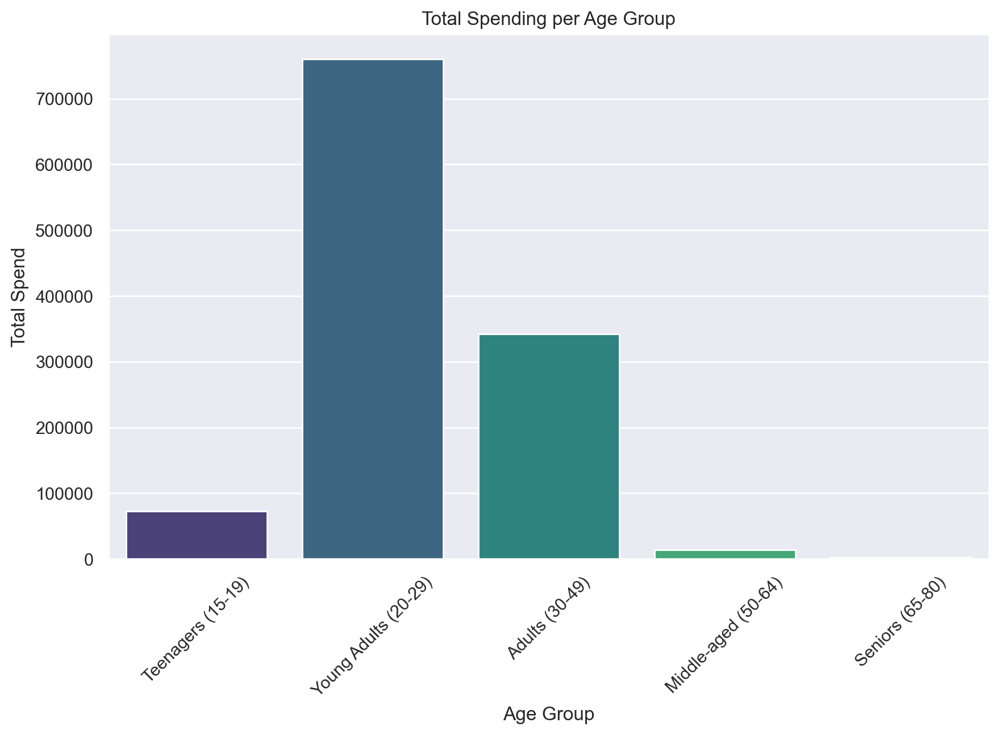

In [766]:
# Group by age group and  total spending
region_spend = df.groupby('age_group')['total_spend'].sum().reset_index()

region_spend = region_spend.sort_values(by='total_spend', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='age_group', y='total_spend', data=region_spend, palette="viridis")

plt.title("Total Spending per Age Group")
plt.xlabel("Age Group")
plt.ylabel("Total Spend")
plt.xticks(rotation=45)
plt.show()

### Cuisine Diversity

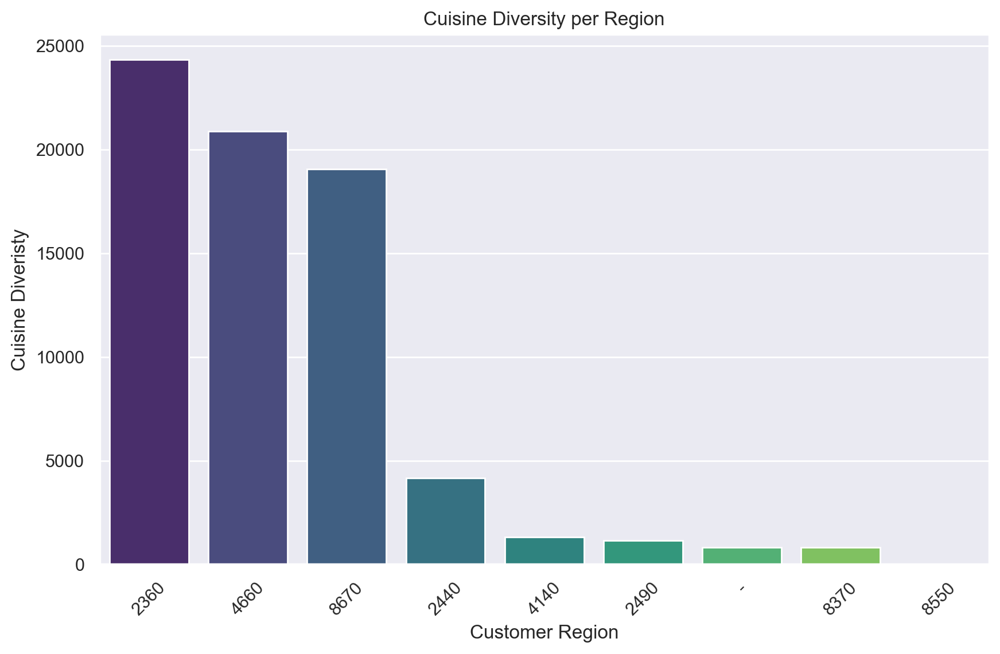

In [764]:
# Group by region and cuisine diversity
region_spend = df.groupby('customer_region')['cuisine_diversity'].sum().reset_index()

region_spend = region_spend.sort_values(by='cuisine_diversity', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='customer_region', y='cuisine_diversity', data=region_spend, palette="viridis")

plt.title("Cuisine Diversity per Region")
plt.xlabel("Customer Region")
plt.ylabel("Cuisine Diveristy")
plt.xticks(rotation=45)
plt.show()

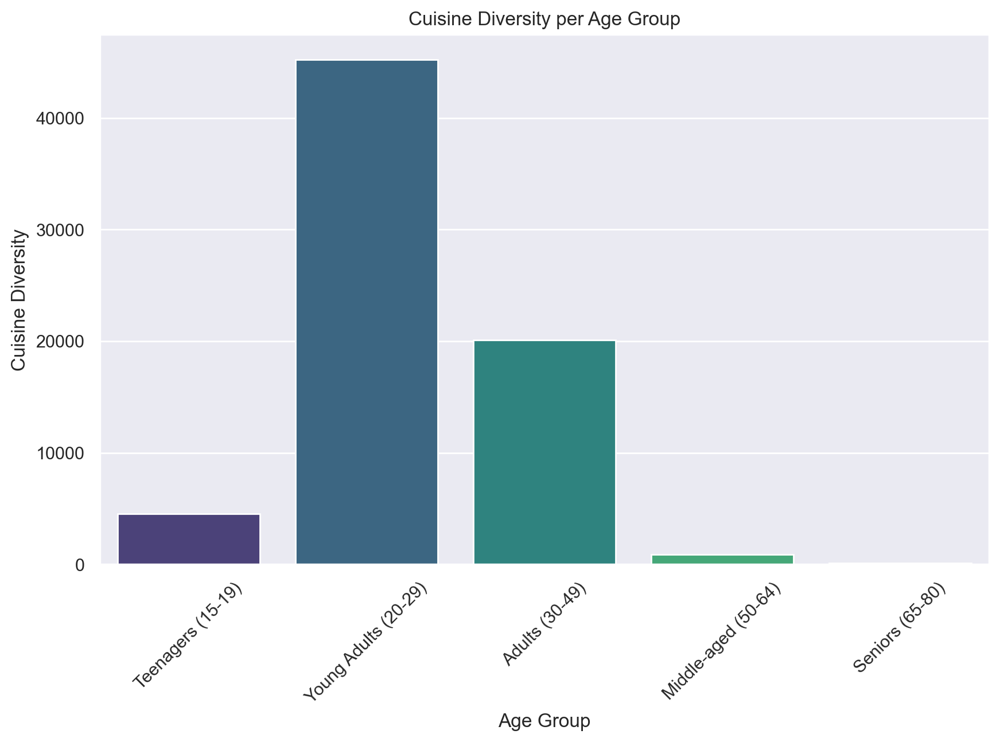

In [767]:
# Group by age group and cuisine diversity
region_spend = df.groupby('age_group')['cuisine_diversity'].sum().reset_index()

region_spend = region_spend.sort_values(by='cuisine_diversity', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='age_group', y='cuisine_diversity', data=region_spend, palette="viridis")

plt.title("Cuisine Diversity per Age Group")
plt.xlabel("Age Group")
plt.ylabel("Cuisine Diversity")
plt.xticks(rotation=45)
plt.show()

### 3 Variables

In [592]:
df['sum_of_orders']=df[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']].sum(axis=1)
# Group by customer_region and customer_age
grouped = df.groupby(['customer_region', 'customer_age'])['sum_of_orders'].sum().reset_index()

# Sort the results
grouped = grouped.sort_values(['customer_region', 'customer_age'])

In [593]:
regional_stats = grouped.groupby('customer_region').agg({
    'customer_age': ['mean', 'min', 'max'],
    'sum_of_orders': ['mean', 'min', 'max', 'sum']
}).reset_index()

print(regional_stats)


  customer_region customer_age         sum_of_orders                 
                          mean min max          mean min   max    sum
0               -    34.314286  17  55     42.685714   1   137   1494
1            2360        45.05  15  79    745.650000   1  3723  44739
2            2440    38.446809  15  72    151.489362   1   614   7120
3            2490    33.805556  16  56     55.388889   1   171   1994
4            4140    36.195122  16  58     65.243902   1   249   2675
5            4660    44.220339  15  80    726.338983   1  3420  42854
6            8370    34.974359  15  68     32.410256   1   119   1264
7            8550         24.7  18  31     10.000000   2    32    100
8            8670    46.396825  15  80    535.761905   1  2750  33753


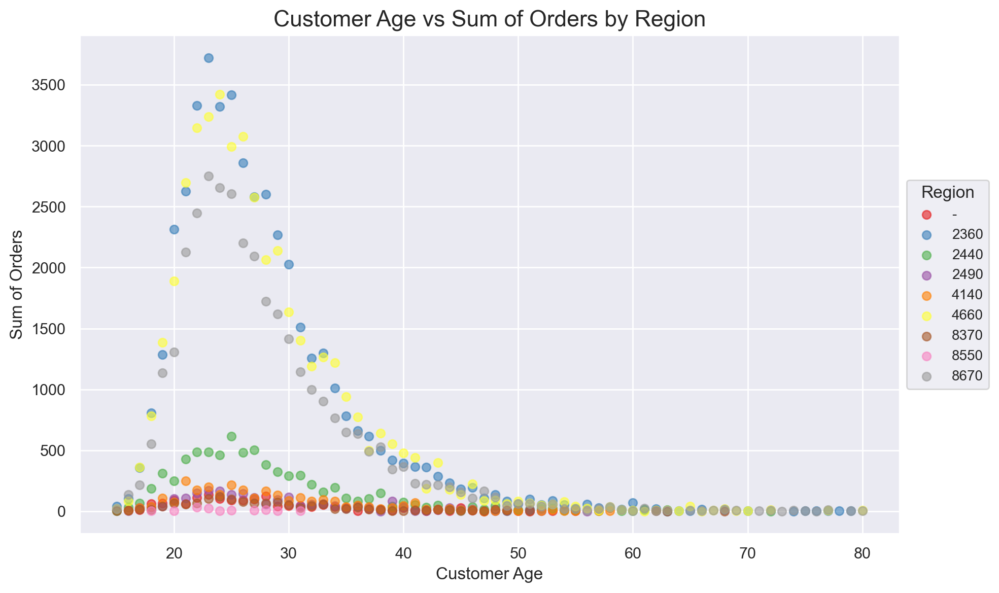

In [596]:
# Create a high-contrast color palette
num_regions = len(grouped['customer_region'].unique())
base_colors = plt.cm.get_cmap('Set1')(np.linspace(0, 1, num_regions))
custom_colors = ['#FF1493', '#00FFFF', '#FFD700', '#32CD32', '#FF4500', '#8A2BE2', '#00CED1']
color_palette = list(base_colors) + custom_colors

plt.figure(figsize=(10, 6))

for i, region in enumerate(grouped['customer_region'].unique()):
    region_data = grouped[grouped['customer_region'] == region]
    plt.scatter(region_data['customer_age'], region_data['sum_of_orders'], 
                label=region, alpha=0.6, color=color_palette[i])

plt.xlabel('Customer Age', fontsize=12)
plt.ylabel('Sum of Orders', fontsize=12)
plt.title('Customer Age vs Sum of Orders by Region', fontsize=16)
plt.legend(title='Region', title_fontsize='12', fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

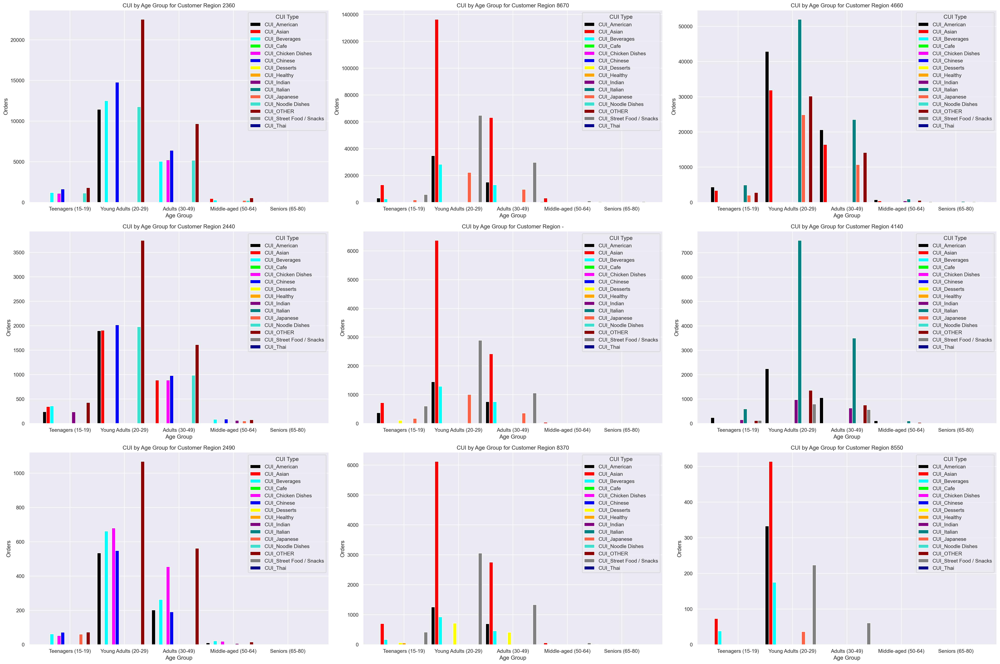

In [597]:
my_colors = plt.get_cmap('tab20').colors  

cuisine_cols = all_cols = [col for col in df.columns if col.startswith('CUI_')]
all_cols.append("customer_region")
all_cols.append("age_group")
group_by_ageG_region_CUI =  df[all_cols].groupby(['customer_region','age_group']).sum()

group_by_ageG_region_CUI = (
    group_by_ageG_region_CUI
    .apply(lambda x: x.nlargest(5),axis=1)
    
)

high_contrast_colors = [
    "#000000",  # Black
    "#FF0000",  # Red
    "#00FFFF",  # Cyan
    "#00FF00",  # Green
    "#FF00FF",  # Magenta
    "#0000FF",  # Blue
    "#FFFF00",  # Yellow
    "#FFA500",  # Orange
    "#800080",  # Purple
    "#008080",  # Teal
    "#FF6347",  # Tomato (bright red-orange)
    "#40E0D0",  # Turquoise
    "#8B0000",  # Dark Red
    "#808080",  # Gray
    "#00008B",  # Dark Blue
    "#ADFF2F"   # Green Yellow
]
rows = math.ceil(len(df["customer_region"].unique())/3)

fig, axes = plt.subplots(rows, 3, figsize=(15, 5 * rows))
axes = axes.flatten()  
for i,region in enumerate(df["customer_region"].unique() ):
    # Filter data for the current customer_region
    region_data = group_by_ageG_region_CUI.loc[region]
    
    # Plot
    region_data.plot(kind='bar',ax=axes[i], figsize=(30, 20), width=1,color=high_contrast_colors)
    axes[i].set_title(f'CUI by Age Group for Customer Region {region}')
    axes[i].set_xlabel('Age Group')
    axes[i].set_ylabel('Orders')
    axes[i].tick_params(axis='x', rotation=0)  # Set x-axis label rotation

    axes[i].legend(title='CUI Type')
    
    
# Show the plot
for j in range(i + 1, len(axes)):
    axes[j].axis('off')
plt.tight_layout()
plt.show()